In [ ]:
import pandas as pd
from pathlib import Path
import numpy as np
import json
from sklearn.preprocessing import OneHotEncoder
ROOT = Path.cwd().parent
motor='DATA_MODEL_Dev/Motor_data_models.csv'
subject='DATA_MODEL_Dev/Subject_data_models.csv'
cognitive='DATA_MODEL_Dev/Cognitive_data_models.csv'
sleep='DATA_MODEL_Dev/Sleep_data_models.csv'
data_split='DATA_RAW_MODELS/Data_split.json'

# DATA SPLIT

In [2]:
with open(ROOT/data_split, "r", encoding="utf-8") as archivo:
    data_subjects = json.load(archivo)

subjects_train=data_subjects['Train_80']
subjects_test=data_subjects['Test_20']

## Normal Data

### X_train and y_train

In [3]:
X_train_subject=pd.read_csv(ROOT/subject)
X_train_subject=X_train_subject[X_train_subject['subject_visit'].isin(subjects_train)]
X_train_subject.drop(columns=['MDS-UPDRS Part II Total Score','MDS-UPDRS Part IV Total Score',
                                'MDS-UPDRS Part III Total Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score',
                                'MDS-UPDRS Total Score','UPDRS_III_ProgressionType','RBD at Enrollment','Birth Date'],inplace=True)

X_train_motor=pd.read_csv(ROOT/motor)
X_train_motor=X_train_motor[X_train_motor['subject_visit'].isin(subjects_train)]

X_train_cognitive=pd.read_csv(ROOT/cognitive)
X_train_cognitive=X_train_cognitive[X_train_cognitive['subject_visit'].isin(subjects_train)]
X_train_cognitive.drop(columns=['UPDRS_III_ProgressionType','MDS-UPDRS Total Score','MDS-UPDRS Part II Total Score',
                                'MDS-UPDRS Part I (Patient Questionnaire) Total Score'], inplace=True)

X_train_sleep=pd.read_csv(ROOT/sleep)
X_train_sleep=X_train_sleep[X_train_sleep['subject_visit'].isin(subjects_train)]
X_train_sleep.drop(columns=['UPDRS_III_ProgressionType','MDS-UPDRS Part II Total Score','MDS-UPDRS Part IV Total Score',
                            'MDS-UPDRS Part III Total Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score',
                            'Sitting and reading','Watching TV','Sitting, inactive in a public place','As a passenger in a car for an hour',
                            'Lying down to rest in the afternoon','Sitting and talking to someone','Sitting quietly after lunch',
                            'In a car, while stopped in traffic','Vivid Dreams','Aggressive or Action-packed dreams','nocturnal behaviour',
                            'move arms/legs during sleep','hurt bed partner','speaking in sleep','sudden limb movements','complex movements',
                            'things fell down','my movements awake me','remember dreams','sleep is disturbed','Stroke','Head trauma',
                            'Parkinsonism','Restless Leg Syndrome (RLS)', 'Narcolepsy','Depression','Epilepsy','Inflammatory disease of the brain'], inplace=True)

X_train=pd.merge(X_train_motor, X_train_cognitive, on='subject_visit', how='inner')
X_train=pd.merge(X_train, X_train_sleep, on='subject_visit', how='inner')
X_train=pd.merge(X_train, X_train_subject, on='subject_visit', how='inner')

X_train.drop(columns=['subject_visit'], inplace=True)
X_train_subject.drop(columns=['subject_visit'], inplace=True)

lower = X_train['Δ UPDRS_III_1Y'].quantile(0.025)
upper = X_train['Δ UPDRS_III_1Y'].quantile(0.972)

X_train = X_train[
    (X_train['Δ UPDRS_III_1Y'] >= lower) &
    (X_train['Δ UPDRS_III_1Y'] <= upper)
]

X_train_motor_model=X_train[['SCHWAB & ENGLAND ADL','DBS_Transition_Visit','DBS_Post_Transition','Does participant have DBS','3.21 HOEHN AND YAHR STAGE',
                       'MDS-UPDRS Part II Total Score','MDS-UPDRS Part III Total Score','MDS-UPDRS Part IV Total Score',
                       'Motor Exam assessment','Coordination assessment','Sensory Exam assessment','Reflexes assessment','CN II-XII assessment',
                       'UPDRS_II_Class','UPDRS_III_Class','UPDRS_IV_Class']+X_train_subject.columns.tolist()]

X_train_cog_model=X_train[['MDS-UPDRS Part I (Patient Questionnaire) Total Score','UPDRS_I_Class','HVLT Total Recall Score','HVLT Delayed Recall Score','HVLT Retention Score','HVLT Recognition Discrimination Index Score',
                    'STAI PART I Score','STAI PART II Score','STAI Total Score','GDS Short Score','Has Depression','Semantic Fluency Scaled Score',
                    'MoCA Total Score','VISUOSPATIAL_EXECUTIVE','NAMING','ATTENTION','LANGUAGE','ABSTRACTION','DELAYED_RECALL','ORIENTATION',
                    'Letter-Number Sequencing Scaled Score','Symbol Digit Modalities Test Total Correct','Benton Judgement of Line Orientation Scaled Score']+X_train_subject.columns.tolist()]

X_train_sleep_model=X_train[['Epworth Sleepiness Scale Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score','UPDRS_I_Class','rbd_status','dream_behavior_score','neuro_score','rbd_summary_score','eps_class']+X_train_subject.columns.tolist()]

X_train.drop(columns=['VISUOSPATIAL_EXECUTIVE','NAMING','ATTENTION','LANGUAGE','ABSTRACTION','DELAYED_RECALL','ORIENTATION'], inplace=True)

y_train=X_train['UPDRS_III_ProgressionType'].map({'Substantial progress.':1,'No significant change.':2,'Substantial improv.':3})
y_train_np_change=X_train['Type_change_updrs3'].map({'Positive':0,'Negative':1})
y_train_lpa=X_train['Perfil_LPA'].map({'General Progress.':1,'Stability':2,'General Improv.':3})
y_train_change_value=X_train['Δ UPDRS_III_1Y']



X_train.drop(columns=['UPDRS_III_ProgressionType','Perfil_LPA','Type_change_updrs3','Δ UPDRS_III_1Y','MDS-UPDRS Total Score','STAI Total Score'], inplace=True)

print(X_train.shape,y_train.shape)

X_train

(690, 48) (690,)


,SCHWAB & ENGLAND ADL,MDS-UPDRS Part I (Patient Questionnaire) Total Score,MDS-UPDRS Part II Total Score,Does participant have DBS,MDS-UPDRS Part III Total Score,3.21 HOEHN AND YAHR STAGE,MDS-UPDRS Part IV Total Score,DBS_Transition_Visit,DBS_Post_Transition,UPDRS_I_Class,...,LRRK2 Mutation at Enrollment,SNCA Mutation at Enrollment,GBA Mutation at Enrollment,Sex of participant at birth,Identify self as White,Education_Years,AGE_AT_VISIT,BMI,Ortostatic_Hypotension,Age_Type
0,90,6,5.0,0,35,2,0.0,0,0.0,0,...,0,0,0,1,1,16.0,69.2,21.051689,0,Middle Aged
1,85,9,10.0,0,53,3,0.0,0,0.0,0,...,0,0,0,0,1,16.0,60.7,25.990903,0,Middle Aged
3,90,8,8.0,0,34,2,0.0,0,0.0,0,...,0,0,0,0,1,16.0,74.1,27.968298,0,Middle Aged
4,85,4,9.0,0,16,2,0.0,0,0.0,0,...,0,0,0,1,1,18.0,74.7,27.102041,0,Middle Aged
5,80,7,10.0,0,21,2,3.0,0,0.0,0,...,0,0,0,1,1,18.0,75.7,26.938776,0,Middle Aged
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
723,90,6,8.0,0,14,2,4.0,0,0.0,0,...,0,0,0,0,1,18.0,65.4,24.920219,0,Middle Aged
724,95,0,1.0,0,11,1,0.0,0,0.0,0,...,0,0,0,1,1,13.0,36.0,23.515579,0,Early Onset
725,85,13,12.0,0,21,2,6.0,0,0.0,1,...,0,0,0,1,1,17.0,50.0,28.731747,0,Early Onset
726,95,3,5.0,0,19,2,0.0,0,0.0,0,...,0,0,0,1,1,16.0,71.3,33.412409,0,Middle Aged


### X_test and y_test

In [4]:
X_test_subject=pd.read_csv(ROOT/subject)
X_test_subject=X_test_subject[X_test_subject['subject_visit'].isin(subjects_test)]
X_test_subject.drop(columns=['MDS-UPDRS Part II Total Score','MDS-UPDRS Part IV Total Score',
                                'MDS-UPDRS Part III Total Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score',
                                'MDS-UPDRS Total Score','UPDRS_III_ProgressionType','RBD at Enrollment','Birth Date'],inplace=True)

X_test_motor=pd.read_csv(ROOT/motor)
X_test_motor=X_test_motor[X_test_motor['subject_visit'].isin(subjects_test)]

X_test_cognitive=pd.read_csv(ROOT/cognitive)
X_test_cognitive=X_test_cognitive[X_test_cognitive['subject_visit'].isin(subjects_test)]
X_test_cognitive.drop(columns=['UPDRS_III_ProgressionType','MDS-UPDRS Total Score','MDS-UPDRS Part II Total Score',
                                'MDS-UPDRS Part I (Patient Questionnaire) Total Score'], inplace=True)

X_test_sleep=pd.read_csv(ROOT/sleep)
X_test_sleep=X_test_sleep[X_test_sleep['subject_visit'].isin(subjects_test)]
X_test_sleep.drop(columns=['UPDRS_III_ProgressionType','MDS-UPDRS Part II Total Score','MDS-UPDRS Part IV Total Score',
                            'MDS-UPDRS Part III Total Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score',
                            'Sitting and reading','Watching TV','Sitting, inactive in a public place','As a passenger in a car for an hour',
                            'Lying down to rest in the afternoon','Sitting and talking to someone','Sitting quietly after lunch',
                            'In a car, while stopped in traffic','Vivid Dreams','Aggressive or Action-packed dreams','nocturnal behaviour',
                            'move arms/legs during sleep','hurt bed partner','speaking in sleep','sudden limb movements','complex movements',
                            'things fell down','my movements awake me','remember dreams','sleep is disturbed','Stroke','Head trauma',
                            'Parkinsonism','Restless Leg Syndrome (RLS)', 'Narcolepsy','Depression','Epilepsy','Inflammatory disease of the brain'], inplace=True)

X_test=pd.merge(X_test_motor, X_test_cognitive, on='subject_visit', how='inner')
X_test=pd.merge(X_test, X_test_sleep, on='subject_visit', how='inner')
X_test=pd.merge(X_test, X_test_subject, on='subject_visit', how='inner')

X_test_motor=X_test[['SCHWAB & ENGLAND ADL','DBS_Transition_Visit','DBS_Post_Transition','Does participant have DBS','3.21 HOEHN AND YAHR STAGE',
                       'MDS-UPDRS Part I (Patient Questionnaire) Total Score','MDS-UPDRS Part II Total Score','MDS-UPDRS Part III Total Score','MDS-UPDRS Part IV Total Score',
                       'UPDRS_I_Class','UPDRS_II_Class','UPDRS_III_Class','UPDRS_IV_Class']]

X_test.drop(columns=['subject_visit'], inplace=True)
X_test_subject.drop(columns=['subject_visit'], inplace=True)

X_test_motor_model=X_test[['SCHWAB & ENGLAND ADL','DBS_Transition_Visit','DBS_Post_Transition','Does participant have DBS','3.21 HOEHN AND YAHR STAGE',
                       'MDS-UPDRS Part II Total Score','MDS-UPDRS Part III Total Score','MDS-UPDRS Part IV Total Score',
                       'Motor Exam assessment','Coordination assessment','Sensory Exam assessment','Reflexes assessment','CN II-XII assessment',
                       'UPDRS_II_Class','UPDRS_III_Class','UPDRS_IV_Class']+X_test_subject.columns.tolist()]

X_test_cog_model=X_test[['MDS-UPDRS Part I (Patient Questionnaire) Total Score','UPDRS_I_Class','HVLT Total Recall Score','HVLT Delayed Recall Score','HVLT Retention Score','HVLT Recognition Discrimination Index Score',
                    'STAI PART I Score','STAI PART II Score','STAI Total Score','GDS Short Score','Has Depression','Semantic Fluency Scaled Score',
                    'MoCA Total Score','VISUOSPATIAL_EXECUTIVE','NAMING','ATTENTION','LANGUAGE','ABSTRACTION','DELAYED_RECALL','ORIENTATION',
                    'Letter-Number Sequencing Scaled Score','Symbol Digit Modalities Test Total Correct','Benton Judgement of Line Orientation Scaled Score']+X_test_subject.columns.tolist()]

X_test_sleep_model=X_test[['Epworth Sleepiness Scale Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score','UPDRS_I_Class','rbd_status','dream_behavior_score','neuro_score','rbd_summary_score','eps_class']+X_test_subject.columns.tolist()]

X_test.drop(columns=['VISUOSPATIAL_EXECUTIVE','NAMING','ATTENTION','LANGUAGE','ABSTRACTION','DELAYED_RECALL','ORIENTATION'], inplace=True)

y_test=X_test['UPDRS_III_ProgressionType'].map({'Substantial progress.':1,'No significant change.':2,'Substantial improv.':3})
y_test_np_change=X_test['Type_change_updrs3'].map({'Positive':0,'Negative':1})
y_test_lpa=X_test['Perfil_LPA'].map({'General Progress.':1,'Stability':2,'General Improv.':3})
y_test_change_value=X_test['Δ UPDRS_III_1Y']

X_test.drop(columns=['UPDRS_III_ProgressionType','Perfil_LPA','Type_change_updrs3','Δ UPDRS_III_1Y','MDS-UPDRS Total Score','STAI Total Score'], inplace=True)

print(X_test.shape,y_test.shape)

(183, 48) (183,)


## Data Agrupations Stability-Improvement VS Worsening

In [5]:
y_train_2_IS_W= y_train.copy()
y_train_2_IS_W=y_train_2_IS_W.replace({1:0,2:1,3:1})

y_test_2_IS_W= y_test.copy()
y_test_2_IS_W=y_test_2_IS_W.replace({1:0,2:1,3:1})

## Data Agrupations Stability VS Improvement-Worsening

In [6]:
y_train_2_S_IW= y_train.copy()
y_train_2_S_IW=y_train_2_S_IW.replace({1:1,2:0,3:1})

y_test_2_S_IW= y_test.copy()
y_test_2_S_IW=y_test_2_S_IW.replace({1:1,2:0,3:1})

## Feature Engineering

In [7]:
X_train_fe=X_train.copy()

X_train_fe['motor_burden']=X_train_fe['MDS-UPDRS Part III Total Score']+X_train_fe['MDS-UPDRS Part IV Total Score']
X_train_fe['QoL_burden']=X_train_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']+X_train_fe['MDS-UPDRS Part II Total Score']
X_train_fe['motor_ratio']=X_train_fe['motor_burden']/(X_train_fe['QoL_burden']+1)
X_train_fe['MDS-UPDRS Total Score']=X_train_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']+X_train_fe['MDS-UPDRS Part II Total Score']+X_train_fe['MDS-UPDRS Part III Total Score']+X_train_fe['MDS-UPDRS Part IV Total Score']

X_train_fe['motor_cog_ratio_qol']=X_train_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']/(X_train_fe['MDS-UPDRS Part II Total Score']+1)

X_train_fe['UPDRS1_weight']=X_train_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']/(X_train_fe['MDS-UPDRS Total Score']+1)
X_train_fe['UPDRS2_weight']=X_train_fe['MDS-UPDRS Part II Total Score']/(X_train_fe['MDS-UPDRS Total Score']+1)
X_train_fe['UPDRS3_weight']=X_train_fe['MDS-UPDRS Part III Total Score']/(X_train_fe['MDS-UPDRS Total Score']+1)

X_train_fe['Class3_H&Y']=X_train_fe['UPDRS_III_Class']/(X_train_fe['3.21 HOEHN AND YAHR STAGE']+0.01)
X_train_fe['Functional_impairment']= X_train_fe['SCHWAB & ENGLAND ADL'].apply(lambda x: 100 - x)

X_train_fe.head()


,SCHWAB & ENGLAND ADL,MDS-UPDRS Part I (Patient Questionnaire) Total Score,MDS-UPDRS Part II Total Score,Does participant have DBS,MDS-UPDRS Part III Total Score,3.21 HOEHN AND YAHR STAGE,MDS-UPDRS Part IV Total Score,DBS_Transition_Visit,DBS_Post_Transition,UPDRS_I_Class,...,motor_burden,QoL_burden,motor_ratio,MDS-UPDRS Total Score,motor_cog_ratio_qol,UPDRS1_weight,UPDRS2_weight,UPDRS3_weight,Class3_H&Y,Functional_impairment
0,90,6,5.0,0,35,2,0.0,0,0.0,0,...,35.0,11.0,2.916667,46.0,1.000000,0.127660,0.106383,0.744681,0.497512,10
1,85,9,10.0,0,53,3,0.0,0,0.0,0,...,53.0,19.0,2.650000,72.0,0.818182,0.123288,0.136986,0.726027,0.332226,15
3,90,8,8.0,0,34,2,0.0,0,0.0,0,...,34.0,16.0,2.000000,50.0,0.888889,0.156863,0.156863,0.666667,0.497512,10
4,85,4,9.0,0,16,2,0.0,0,0.0,0,...,16.0,13.0,1.142857,29.0,0.400000,0.133333,0.300000,0.533333,0.000000,15
5,80,7,10.0,0,21,2,3.0,0,0.0,0,...,24.0,17.0,1.333333,41.0,0.636364,0.166667,0.238095,0.500000,0.000000,20


In [8]:
X_test_fe=X_test.copy()

X_test_fe['motor_burden']=X_test_fe['MDS-UPDRS Part III Total Score']+X_test_fe['MDS-UPDRS Part IV Total Score']
X_test_fe['QoL_burden']=X_test_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']+X_test_fe['MDS-UPDRS Part II Total Score']
X_test_fe['motor_ratio']=X_test_fe['motor_burden']/(X_test_fe['QoL_burden']+1)
X_test_fe['MDS-UPDRS Total Score']=X_test_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']+X_test_fe['MDS-UPDRS Part II Total Score']+X_test_fe['MDS-UPDRS Part III Total Score']+X_test_fe['MDS-UPDRS Part IV Total Score']


X_test_fe['motor_cog_ratio_qol']=X_test_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']/(X_test_fe['MDS-UPDRS Part II Total Score']+1)

X_test_fe['UPDRS1_weight']=X_test_fe['MDS-UPDRS Part I (Patient Questionnaire) Total Score']/(X_test_fe['MDS-UPDRS Total Score']+1)
X_test_fe['UPDRS2_weight']=X_test_fe['MDS-UPDRS Part II Total Score']/(X_test_fe['MDS-UPDRS Total Score']+1)
X_test_fe['UPDRS3_weight']=X_test_fe['MDS-UPDRS Part III Total Score']/(X_test_fe['MDS-UPDRS Total Score']+1)

X_test_fe['Class3_H&Y']=X_test_fe['UPDRS_III_Class']/(X_test_fe['3.21 HOEHN AND YAHR STAGE']+0.01)
X_test_fe['Functional_impairment']= X_test_fe['SCHWAB & ENGLAND ADL'].apply(lambda x: 100 - x)

X_test_fe.head()


,SCHWAB & ENGLAND ADL,MDS-UPDRS Part I (Patient Questionnaire) Total Score,MDS-UPDRS Part II Total Score,Does participant have DBS,MDS-UPDRS Part III Total Score,3.21 HOEHN AND YAHR STAGE,MDS-UPDRS Part IV Total Score,DBS_Transition_Visit,DBS_Post_Transition,UPDRS_I_Class,...,motor_burden,QoL_burden,motor_ratio,MDS-UPDRS Total Score,motor_cog_ratio_qol,UPDRS1_weight,UPDRS2_weight,UPDRS3_weight,Class3_H&Y,Functional_impairment
0,90,5,5.0,0,18,2,5.0,0,0.0,0,...,23.0,10.0,2.090909,33.0,0.833333,0.147059,0.147059,0.529412,0.0,10
1,90,4,1.0,0,15,2,4.0,0,0.0,0,...,19.0,5.0,3.166667,24.0,2.000000,0.160000,0.040000,0.600000,0.0,10
2,80,2,7.0,0,13,2,1.0,0,0.0,0,...,14.0,9.0,1.400000,23.0,0.250000,0.083333,0.291667,0.541667,0.0,20
3,90,2,3.0,0,15,2,0.0,0,0.0,0,...,15.0,5.0,2.500000,20.0,0.500000,0.095238,0.142857,0.714286,0.0,10
4,80,2,4.0,0,9,2,0.0,0,0.0,0,...,9.0,6.0,1.285714,15.0,0.400000,0.125000,0.250000,0.562500,0.0,20


# Clustering Subjects

In [9]:
X_train_subject=X_train[X_train_subject.columns.tolist()+
                        ['MDS-UPDRS Part II Total Score','MDS-UPDRS Part IV Total Score','MDS-UPDRS Part III Total Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score',
                         'UPDRS_I_Class','UPDRS_II_Class','UPDRS_III_Class','UPDRS_IV_Class']].copy()
X_train_subject['Education_Type']=X_train_subject['Education_Years'].apply(lambda x: 'Doctorate studies' if x>=20 else ('Master studies' if x>=17 else ('Bachelor studies' if x>=16 else 'High School or less')))
X_train_subject['BMI_Category']=X_train_subject['BMI'].apply(lambda x: 'Underweight' if x<18.5 else ('Normal weight' if x<24.9 else ('Overweight' if x<29.9 else 'Obesity')))




## Categorical Clustering

In [52]:
X_train_subject_categorical=X_train_subject[['Parkin Mutation at Enrollment',
 'LRRK2 Mutation at Enrollment',
 'SNCA Mutation at Enrollment',
 'GBA Mutation at Enrollment',
 'Sex of participant at birth',
 'Identify self as White',
 'Age_Type',
 'Ortostatic_Hypotension',
 'UPDRS_I_Class',
 'UPDRS_II_Class',
 'UPDRS_III_Class',
 'UPDRS_IV_Class',
 'Education_Type',
 'BMI_Category']].copy()

age_bmi_df = pd.get_dummies(
    X_train_subject_categorical[['Age_Type','BMI_Category','Education_Type']]
)

X_train_subject_categorical = pd.concat(
    [X_train_subject_categorical.drop(columns=['Age_Type','BMI_Category','Education_Type']), age_bmi_df],
    axis=1
).astype("int8")

X_train_subject_categorical.head()


,Parkin Mutation at Enrollment,LRRK2 Mutation at Enrollment,SNCA Mutation at Enrollment,GBA Mutation at Enrollment,Sex of participant at birth,Identify self as White,Ortostatic_Hypotension,UPDRS_I_Class,UPDRS_II_Class,UPDRS_III_Class,...,Age_Type_Early Onset,Age_Type_Middle Aged,BMI_Category_Normal weight,BMI_Category_Obesity,BMI_Category_Overweight,BMI_Category_Underweight,Education_Type_Bachelor studies,Education_Type_Doctorate studies,Education_Type_High School or less,Education_Type_Master studies
0,0,0,0,0,1,1,0,0,0,1,...,0,1,1,0,0,0,1,0,0,0
1,0,0,0,0,0,1,0,0,0,1,...,0,1,0,0,1,0,1,0,0,0
3,0,0,0,0,0,1,0,0,0,1,...,0,1,0,0,1,0,1,0,0,0
4,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
5,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1


In [53]:
import prince 

mca = prince.MCA(
    one_hot=False,
    n_components=12,
    n_iter=3,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
mca = mca.fit(X_train_subject_categorical)

mca.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.240,8.97%,8.97%
1,0.230,8.60%,17.57%
2,0.212,7.92%,25.49%
3,0.208,7.76%,33.25%
4,0.195,7.30%,40.55%
5,0.181,6.75%,47.30%
6,0.178,6.64%,53.94%
7,0.165,6.18%,60.12%
8,0.158,5.90%,66.02%


In [56]:
mca.plot(
    X_train_subject_categorical,
    x_component=0,
    y_component=1,
    show_column_markers=False,
    show_row_markers=True,
    show_column_labels=False,
    show_row_labels=False
)

alt.LayerChart(...)

In [55]:
mca.column_contributions_.style.format('{:.0%}')

,0,1,2,3,4,5,6,7,8,9,10,11
Parkin Mutation at Enrollment,0%,0%,2%,1%,0%,18%,16%,22%,27%,11%,1%,0%
LRRK2 Mutation at Enrollment,0%,0%,0%,1%,11%,1%,1%,5%,14%,1%,16%,7%
SNCA Mutation at Enrollment,10%,9%,0%,3%,3%,1%,5%,15%,0%,1%,2%,40%
GBA Mutation at Enrollment,3%,0%,3%,0%,1%,4%,1%,14%,24%,18%,7%,0%
Sex of participant at birth,2%,0%,2%,2%,1%,1%,0%,0%,0%,2%,0%,1%
Identify self as White,0%,0%,1%,0%,0%,0%,0%,0%,1%,0%,0%,0%
Ortostatic_Hypotension,0%,1%,7%,0%,0%,0%,0%,0%,3%,1%,0%,6%
UPDRS_I_Class,0%,0%,5%,0%,3%,7%,0%,1%,7%,8%,0%,0%
UPDRS_II_Class,0%,0%,9%,1%,7%,6%,0%,1%,8%,1%,3%,1%
UPDRS_III_Class,1%,1%,9%,1%,5%,0%,0%,0%,0%,1%,29%,11%


Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 2768.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 2768.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 2768.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 2768.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 2768.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 77, cost: 2526.0
Run 1, iteration: 2/100, moves: 69, cost: 2526.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 2534.0
Init: initializing centroids
Ini

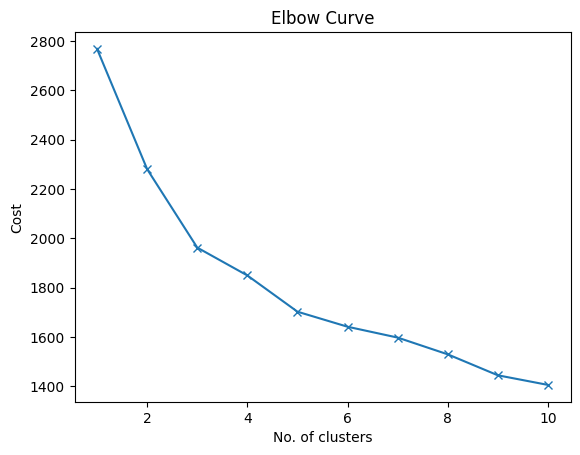

In [57]:
from kmodes.kmodes import KModes
import matplotlib.pyplot as plt
cost = []
K = range(1,11)
for k in list(K):
    kmode = KModes(n_clusters=k, init = "random", n_init = 5,random_state=42,verbose=1)
    kmode.fit_predict(X_train_subject_categorical)
    cost.append(kmode.cost_)
    
plt.plot(K, cost, 'x-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Curve')
plt.show()

## DATA Types

### Multimodal Data Types

In [9]:
categorical_col=['Does participant have DBS','DBS_Transition_Visit','3.21 HOEHN AND YAHR STAGE','UPDRS_I_Class','UPDRS_II_Class','UPDRS_III_Class',
'Motor Exam assessment','Coordination assessment','Sensory Exam assessment','Reflexes assessment','CN II-XII assessment',
'Has Depression','rbd_status', 'neuro_score', 'eps_class','Parkin Mutation at Enrollment','LRRK2 Mutation at Enrollment','SNCA Mutation at Enrollment',
'GBA Mutation at Enrollment','Sex of participant at birth','Identify self as White','Ortostatic_Hypotension','UPDRS_IV_Class']

nominal_cols=['Does participant have DBS','Motor Exam assessment', 'Coordination assessment', 'Sensory Exam assessment', 
'Reflexes assessment', 'CN II-XII assessment','Has Depression','rbd_status','neuro_score','eps_class','Parkin Mutation at Enrollment',
'LRRK2 Mutation at Enrollment','SNCA Mutation at Enrollment','GBA Mutation at Enrollment','Sex of participant at birth','Identify self as White',
'Ortostatic_Hypotension']

ordinal_cols=['3.21 HOEHN AND YAHR STAGE','UPDRS_I_Class','UPDRS_II_Class','UPDRS_III_Class','UPDRS_IV_Class']

numerical_col=[col for col in X_train.columns.tolist() if col not in categorical_col+ordinal_cols]



### Data Type per Modality

In [10]:
# Motor model columns
numerical_col_motor_model=['SCHWAB & ENGLAND ADL','MDS-UPDRS Part II Total Score','MDS-UPDRS Part III Total Score','MDS-UPDRS Part IV Total Score','Birth Date','Education_Years','AGE_AT_VISIT','BMI']
ordinal_cols_motor_model=['3.21 HOEHN AND YAHR STAGE','UPDRS_II_Class','UPDRS_III_Class','UPDRS_IV_Class','DBS_Post_Transition']
categorical_col_motor_model=['Does participant have DBS','DBS_Transition_Visit','Parkin Mutation at Enrollment','LRRK2 Mutation at Enrollment',
                            'SNCA Mutation at Enrollment','GBA Mutation at Enrollment','Sex of participant at birth','Identify self as White','Ortostatic_Hypotension',
                            'Motor Exam assessment', 'Coordination assessment', 'Sensory Exam assessment', 'Reflexes assessment', 'CN II-XII assessment']

# Cognitive model columns
numerical_col_cog_model=['MDS-UPDRS Part I (Patient Questionnaire) Total Score','HVLT Total Recall Score','HVLT Delayed Recall Score',
                         'HVLT Retention Score','HVLT Recognition Discrimination Index Score',
                         'STAI PART I Score','STAI PART II Score','STAI Total Score','GDS Short Score','Semantic Fluency Scaled Score',
                         'MoCA Total Score','Letter-Number Sequencing Scaled Score','Symbol Digit Modalities Test Total Correct',
                         'Benton Judgement of Line Orientation Scaled Score','Birth Date','Education_Years','AGE_AT_VISIT','BMI']

ordinal_cols_cog_model=['UPDRS_I_Class','VISUOSPATIAL_EXECUTIVE','NAMING','ATTENTION','LANGUAGE','ABSTRACTION','DELAYED_RECALL','ORIENTATION']
categorical_col_cog_model=['Has Depression','Parkin Mutation at Enrollment','LRRK2 Mutation at Enrollment','SNCA Mutation at Enrollment',
                           'GBA Mutation at Enrollment','Sex of participant at birth','Identify self as White','Ortostatic_Hypotension']

# Sleep model columns
numerical_col_sleep_model=['Epworth Sleepiness Scale Score','MDS-UPDRS Part I (Patient Questionnaire) Total Score','Birth Date','Education_Years','AGE_AT_VISIT','BMI','dream_behavior_score','rbd_summary_score']
ordinal_cols_sleep_model=['UPDRS_I_Class']
categorical_col_sleep_model=['rbd_status','neuro_score','eps_class','Parkin Mutation at Enrollment','LRRK2 Mutation at Enrollment','SNCA Mutation at Enrollment',
                           'GBA Mutation at Enrollment','Sex of participant at birth','Identify self as White','Ortostatic_Hypotension']


# Clases Definidas?

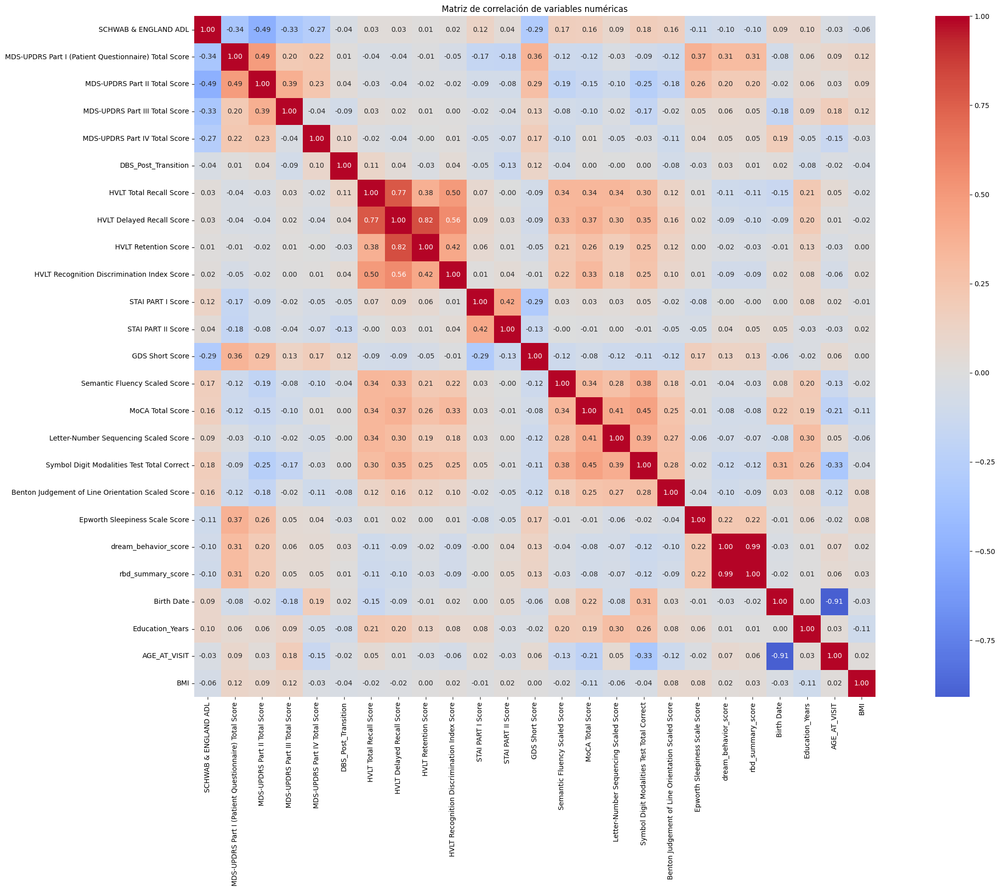

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calcular correlación
corr_matrix = X_train[numerical_col].corr()

# Crear el gráfico
plt.figure(figsize=(26, 18))
sns.heatmap(
    corr_matrix,
    annot=True,        # muestra los valores
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True
)

plt.title("Matriz de correlación de variables numéricas")
plt.tight_layout()
plt.show()


## PCA

In [12]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def plot_pca(X_train, y_train, y_train_2_S_IW, y_train_2_IS_W, y_train_np_change, y_train_lpa, numerical_col, ordinal_cols, name_train):
    # Escalado
    X_scaled = StandardScaler().fit_transform(X_train[numerical_col+ordinal_cols])

    # PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # Crear subplots
    fig, axes = plt.subplots(1, 5, figsize=(24, 5), sharex=True, sharey=True)

    # --- Subplot 1 ---
    for c in y_train.unique():
        axes[0].scatter(
            X_pca[y_train == c, 0],
            X_pca[y_train == c, 1],
            label=f"Clase {c}",
            alpha=0.6
        )
    axes[0].set_title("PCA - y_train")
    axes[0].set_xlabel("Principal Component 1")
    axes[0].set_ylabel("Principal Component 2")
    axes[0].legend()

    # --- Subplot 2 ---
    for c in y_train_2_S_IW.unique():
        axes[1].scatter(
            X_pca[y_train_2_S_IW == c, 0],
            X_pca[y_train_2_S_IW == c, 1],
            label=f"Clase {c}",
            alpha=0.6
        )
    axes[1].set_title("PCA - y_train_2_S_IW")
    axes[1].set_xlabel("Principal Component 1")
    axes[1].set_ylabel("Principal Component 2")
    axes[1].legend()

    # --- Subplot 3 ---
    for c in y_train_2_IS_W.unique():
        axes[2].scatter(
            X_pca[y_train_2_IS_W == c, 0],
            X_pca[y_train_2_IS_W == c, 1],
            label=f"Clase {c}",
            alpha=0.6
        )
    axes[2].set_title("PCA - y_train_2_IS_W")
    axes[2].set_xlabel("Principal Component 1")
    axes[2].set_ylabel("Principal Component 2")
    axes[2].legend()


    # --- Subplot 4 ---
    for c in y_train_np_change.unique():
        axes[3].scatter(
            X_pca[y_train_np_change == c, 0],
            X_pca[y_train_np_change == c, 1],
            label=f"Clase {c}",
            alpha=0.6
        )
    axes[3].set_title("PCA - y_train_np_change")
    axes[3].set_xlabel("Principal Component 1")
    axes[3].set_ylabel("Principal Component 2")
    axes[3].legend()

    # --- Subplot 5 ---
    for c in y_train_lpa.unique():
        axes[4].scatter(
            X_pca[y_train_lpa == c, 0],
            X_pca[y_train_lpa == c, 1],
            label=f"Clase {c}",
            alpha=0.6
        )
    axes[4].set_title("PCA - y_train_lpa")
    axes[4].set_xlabel("Principal Component 1")
    axes[4].set_ylabel("Principal Component 2")
    axes[4].legend()


    plt.suptitle(f"PCA for {name_train} - Overlap Between Clases", fontsize=14)
    plt.tight_layout()
    plt.show()


### PCA Multimodal

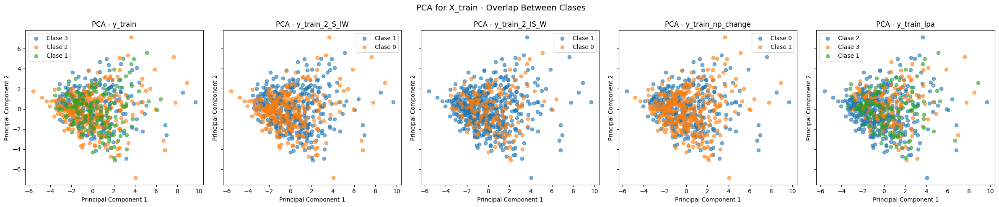

In [13]:
plot_pca(X_train, y_train, y_train_2_S_IW, y_train_2_IS_W, y_train_np_change, y_train_lpa, numerical_col, ordinal_cols, "X_train")

### PCA for Modality

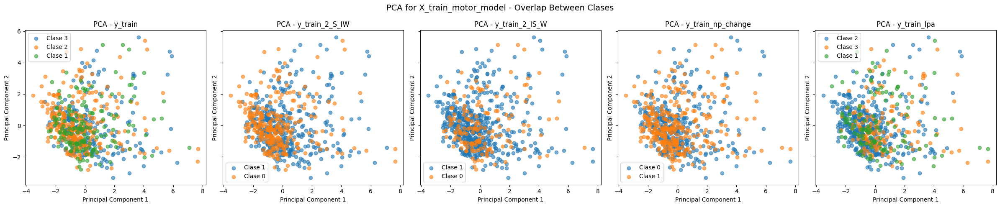

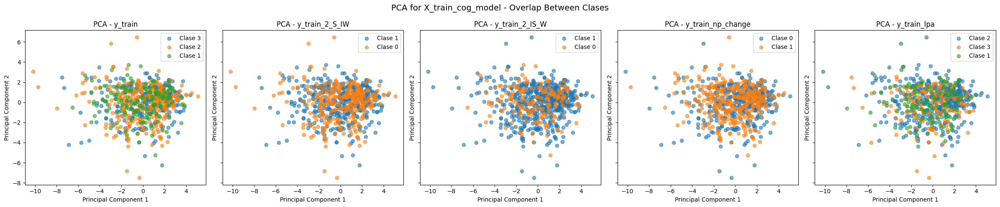

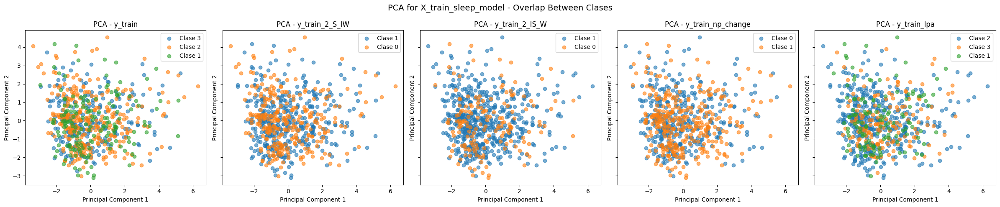

In [14]:
plot_pca(X_train_motor_model, y_train, y_train_2_S_IW, y_train_2_IS_W, y_train_np_change, y_train_lpa, numerical_col_motor_model, ordinal_cols_motor_model, "X_train_motor_model")
plot_pca(X_train_cog_model, y_train, y_train_2_S_IW, y_train_2_IS_W, y_train_np_change, y_train_lpa, numerical_col_cog_model, ordinal_cols_cog_model, "X_train_cog_model")
plot_pca(X_train_sleep_model, y_train, y_train_2_S_IW, y_train_2_IS_W, y_train_np_change, y_train_lpa, numerical_col_sleep_model, ordinal_cols_sleep_model, "X_train_sleep_model")

## PCA Variance Plot

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

    # 1. Scaling
def plot_pca_variance(X_train, numerical_col, ordinal_cols, name_train):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train[numerical_col+ordinal_cols])  

    # 2. PCA
    pca = PCA()
    pca.fit(X_scaled)

    # 3. Explained variance
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)

    # 4. Plot
    plt.figure(figsize=(8, 5))

    plt.bar(
        range(1, len(explained_variance) + 1),
        explained_variance,
        alpha=0.7,
        label="Explained variance per component"
    )

    plt.plot(
        range(1, len(cumulative_variance) + 1),
        cumulative_variance,
        marker="o",
        color="black",
        label="Cumulative explained variance"
    )

    plt.axhline(
        y=0.8,
        color="red",
        linestyle="--",
        linewidth=1.5,
        label="80% explained variance"
    )

    plt.xlabel("Principal components")
    plt.ylabel("Proportion of explained variance")
    plt.title("PCA – Explained and Cumulative Variance for " + name_train)
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


### Multimodal PCA Variance Plot

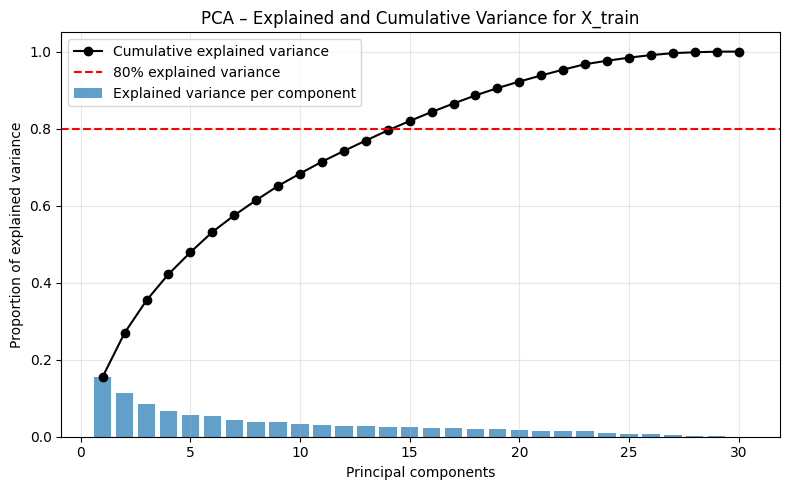

In [16]:
plot_pca_variance(X_train, numerical_col, ordinal_cols, "X_train")

### PCA Variance Plot by modality

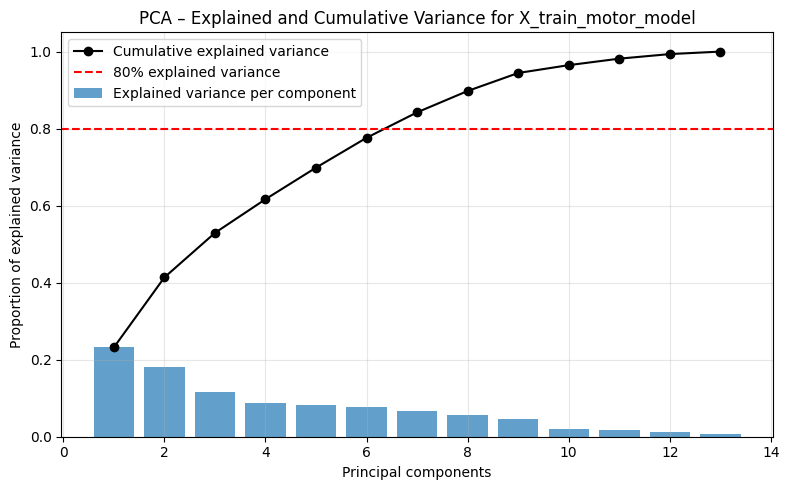

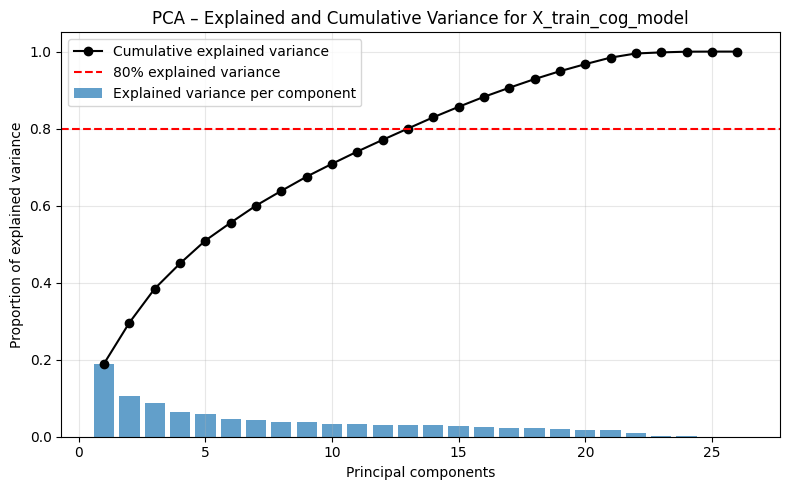

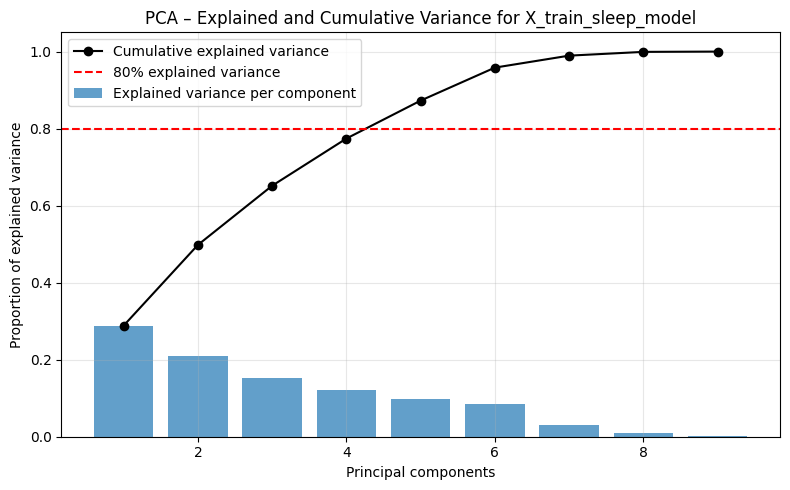

In [17]:
plot_pca_variance(X_train_motor_model, numerical_col_motor_model, ordinal_cols_motor_model, "X_train_motor_model")
plot_pca_variance(X_train_cog_model, numerical_col_cog_model, ordinal_cols_cog_model, "X_train_cog_model")
plot_pca_variance(X_train_sleep_model, numerical_col_sleep_model, ordinal_cols_sleep_model, "X_train_sleep_model")

## FAMD development

### FAMD multimodel

In [18]:
import prince
famd = prince.FAMD(
    n_components=30,
    n_iter=3,
    copy=True,
    check_input=True,
    random_state=42,
    engine="sklearn",
    handle_unknown="error" 
)

X_train[numerical_col+ ordinal_cols] = X_train[numerical_col+ordinal_cols].astype(float)
X_train[nominal_cols] = X_train[nominal_cols].astype(object)
famd = famd.fit(X_train[nominal_cols + ordinal_cols + numerical_col])
X_famd = famd.row_coordinates(X_train[nominal_cols + ordinal_cols + numerical_col])[range(0,16)].to_numpy()
summary_multidomain = famd.eigenvalues_summary
summary_multidomain

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,15.174,8.70%,8.70%
1,14.379,8.24%,16.94%
2,12.420,7.12%,24.05%
3,10.316,5.91%,29.97%
4,9.795,5.61%,35.58%
5,9.458,5.42%,41.00%
6,8.966,5.14%,46.14%
7,8.547,4.90%,51.04%
8,8.357,4.79%,55.82%


### FAMD by domain

1. Motor

In [19]:
X_train_motor_model[numerical_col_motor_model+ ordinal_cols_motor_model] = X_train_motor_model[numerical_col_motor_model+ordinal_cols_motor_model].astype(float)
X_train_motor_model[categorical_col_motor_model] = X_train_motor_model[categorical_col_motor_model].astype(object)
famd = famd.fit(X_train_motor_model[categorical_col_motor_model + ordinal_cols_motor_model + numerical_col_motor_model])
X_famd_motor_model = famd.row_coordinates(X_train_motor_model[categorical_col_motor_model + ordinal_cols_motor_model + numerical_col_motor_model])[range(0,11)].to_numpy()
summary_motor = famd.eigenvalues_summary
summary_motor

/tmp/ipykernel_2627133/1417132658.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_motor_model[numerical_col_motor_model+ ordinal_cols_motor_model] = X_train_motor_model[numerical_col_motor_model+ordinal_cols_motor_model].astype(float)
/tmp/ipykernel_2627133/1417132658.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_motor_model[categorical_col_motor_model] = X_train_motor_model[categorical_col_motor_model].astype(object)


,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,12.375,11.15%,11.15%
1,10.667,9.61%,20.76%
2,8.841,7.97%,28.72%
3,7.958,7.17%,35.89%
4,7.740,6.97%,42.87%
5,7.086,6.38%,49.25%
6,6.977,6.29%,55.54%
7,6.756,6.09%,61.62%
8,6.591,5.94%,67.56%


2. Cognitive

In [20]:
X_train_cog_model[numerical_col_cog_model+ ordinal_cols_cog_model] = X_train_cog_model[numerical_col_cog_model+ordinal_cols_cog_model].astype(float)
X_train_cog_model[categorical_col_cog_model] = X_train_cog_model[categorical_col_cog_model].astype(object)
famd = famd.fit(X_train_cog_model[categorical_col_cog_model + ordinal_cols_cog_model + numerical_col_cog_model])
X_famd_cog_model = famd.row_coordinates(X_train_cog_model[categorical_col_cog_model + ordinal_cols_cog_model + numerical_col_cog_model])[range(0,14)].to_numpy()
summary_cog = famd.eigenvalues_summary
summary_cog

/tmp/ipykernel_2627133/1905580065.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_cog_model[numerical_col_cog_model+ ordinal_cols_cog_model] = X_train_cog_model[numerical_col_cog_model+ordinal_cols_cog_model].astype(float)
/tmp/ipykernel_2627133/1905580065.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_cog_model[categorical_col_cog_model] = X_train_cog_model[categorical_col_cog_model].astype(object)


,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,6.125,10.56%,10.56%
1,5.517,9.51%,20.07%
2,4.767,8.22%,28.29%
3,4.573,7.89%,36.18%
4,4.153,7.16%,43.34%
5,3.984,6.87%,50.20%
6,3.715,6.41%,56.61%
7,3.626,6.25%,62.86%
8,2.762,4.76%,67.62%


3. Sleep

In [21]:
X_train_sleep_model[numerical_col_sleep_model+ ordinal_cols_sleep_model] = X_train_sleep_model[numerical_col_sleep_model+ordinal_cols_sleep_model].astype(float)
X_train_sleep_model[categorical_col_sleep_model] = X_train_sleep_model[categorical_col_sleep_model].astype(object)
famd = famd.fit(X_train_sleep_model[categorical_col_sleep_model + ordinal_cols_sleep_model + numerical_col_sleep_model])
X_famd_sleep_model = famd.row_coordinates(X_train_sleep_model[categorical_col_sleep_model + ordinal_cols_sleep_model + numerical_col_sleep_model])[range(0,9)].to_numpy()
summary_sleep = famd.eigenvalues_summary
summary_sleep

/tmp/ipykernel_2627133/499818100.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_sleep_model[numerical_col_sleep_model+ ordinal_cols_sleep_model] = X_train_sleep_model[numerical_col_sleep_model+ordinal_cols_sleep_model].astype(float)
/tmp/ipykernel_2627133/499818100.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_sleep_model[categorical_col_sleep_model] = X_train_sleep_model[categorical_col_sleep_model].astype(object)


,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,8.222,13.94%,13.94%
1,6.577,11.15%,25.08%
2,6.219,10.54%,35.62%
3,5.480,9.29%,44.91%
4,5.120,8.68%,53.59%
5,4.969,8.42%,62.01%
6,4.715,7.99%,70.00%
7,4.478,7.59%,77.59%
8,3.897,6.60%,84.20%


## FAMD VARIANCE PLOT

In [22]:

def plot_famd_variance(summary, title):
    # Columnas exactas según tu tabla
    var_col = "% of variance"
    cum_col = "% of variance (cumulative)"

    # --- Parsear "8.70%" -> 0.087 ---
    def pct_series_to_float01(s):
        # acepta strings con % y también números
        s = s.astype(str).str.replace("%", "", regex=False).str.strip()
        return s.astype(float).to_numpy() / 100.0

    explained = pct_series_to_float01(summary[var_col])
    cumulative = pct_series_to_float01(summary[cum_col])

    # seguridad: que acumulada sea monótona
    cumulative = np.maximum.accumulate(cumulative)

    n = len(explained)
    x = np.arange(1, n + 1)

    # --- Umbral y k ---
    threshold = 0.80
    idx = np.where(cumulative >= threshold)[0]
    k_80 = int(idx[0] + 1) if len(idx) else None  # +1 porque x empieza en 1

    # --- Plot ---
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.bar(
        x, explained,
        alpha=0.75,
        edgecolor="white",
        linewidth=0.8,
        label="% of variance per component"
    )

    ax.plot(
        x, cumulative,
        marker="o",
        markersize=4,
        linewidth=2,
        color="black",
        label="% of variance (cumulative)"
    )

    ax.axhline(threshold, color="red", linestyle="--", linewidth=1.5, label="80% variance")


    ax.axvline(k_80, color="red", linestyle=":", linewidth=1.2)
    ax.scatter([k_80], [cumulative[k_80 - 1]], color="red", zorder=5)


    ax.set_xlim(0.5, n + 0.5)
    ax.set_ylim(0, 1.05)

    ax.set_xlabel("Components")
    ax.set_ylabel("Proportion of explained variance")
    ax.set_title(f"FAMD for {title} – Explained and cumulative variance")


    if n > 15:
        ax.set_xticks(np.arange(1, n + 1, 2))

    ax.grid(axis="y", alpha=0.25)
    ax.legend(loc="best")
    fig.tight_layout()
    plt.show()

    print(f"Componentes para llegar a {threshold:.0%}: {k_80} (acumulada={cumulative[k_80-1]:.2%})")    

### FAMD Variance Plot Multidomain

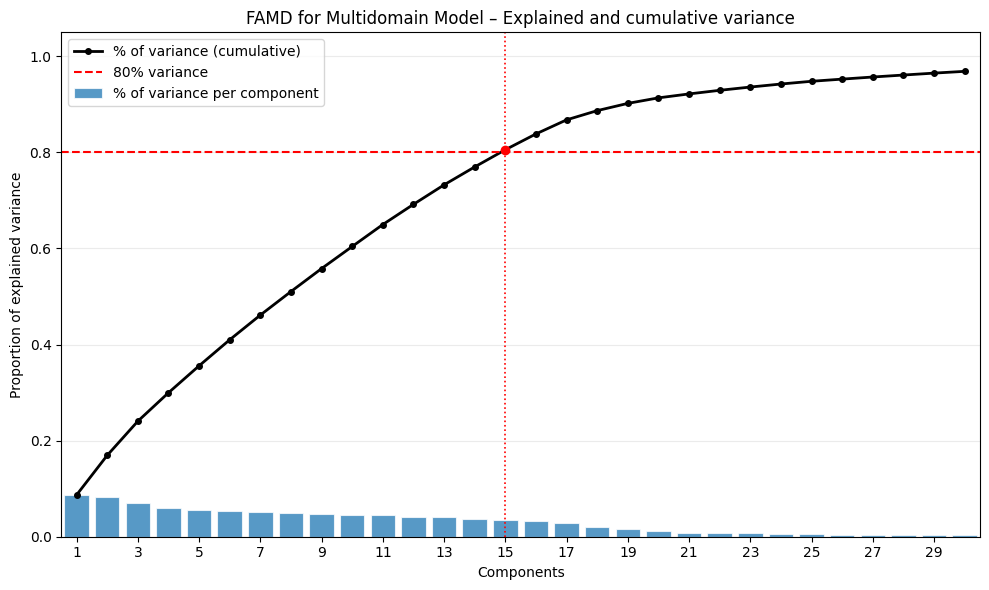

Componentes para llegar a 80%: 15 (acumulada=80.56%)


In [23]:
plot_famd_variance(summary_multidomain,'Multidomain Model')

### FAMD Variance Plot By domain

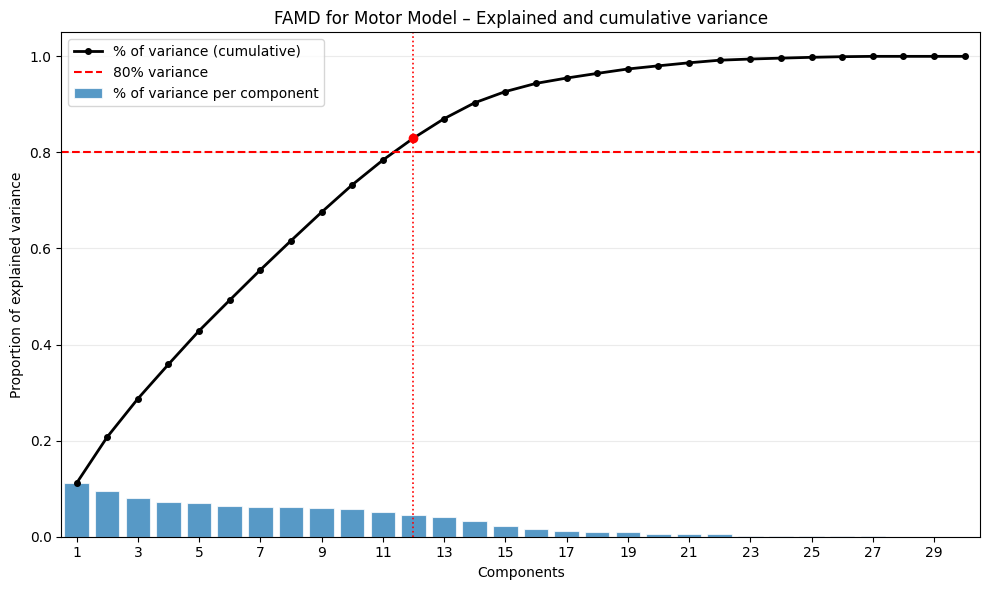

Componentes para llegar a 80%: 12 (acumulada=82.98%)


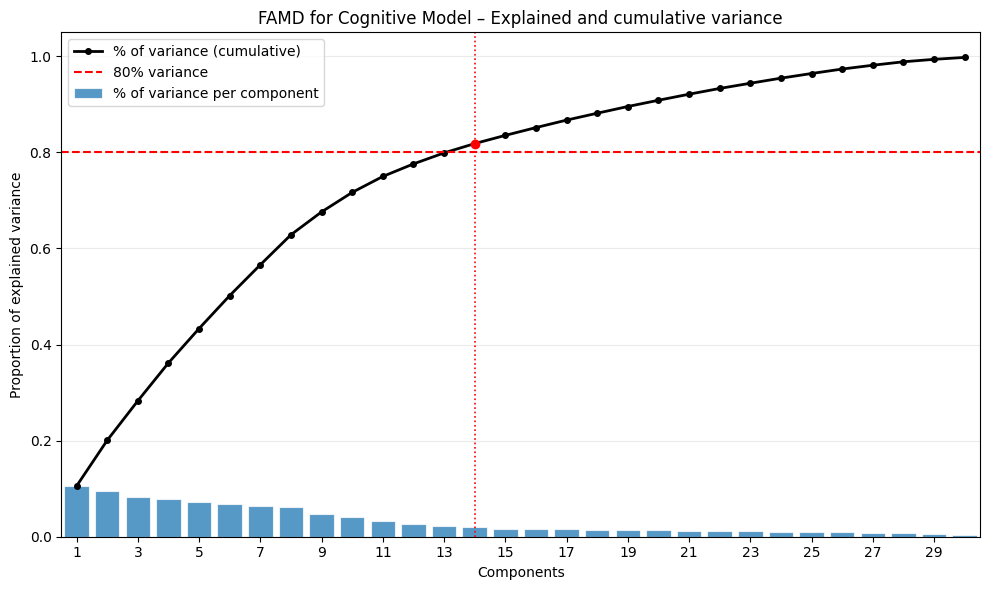

Componentes para llegar a 80%: 14 (acumulada=81.84%)


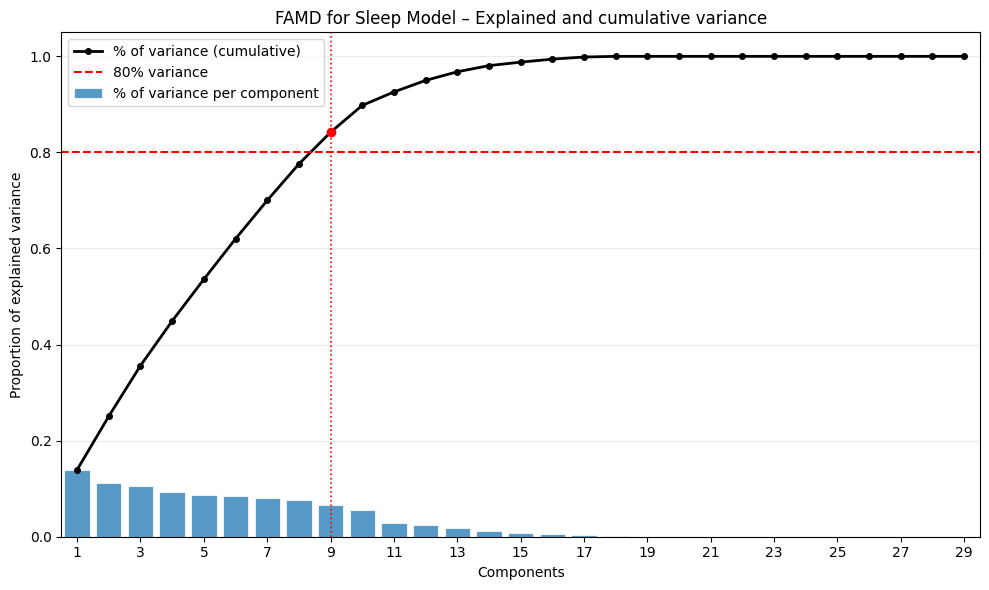

Componentes para llegar a 80%: 9 (acumulada=84.20%)


In [24]:
plot_famd_variance(summary_motor,'Motor Model')
plot_famd_variance(summary_cog, 'Cognitive Model')
plot_famd_variance(summary_sleep, 'Sleep Model')

## Δ UPDRS_III_1Y DISTRIBUTION

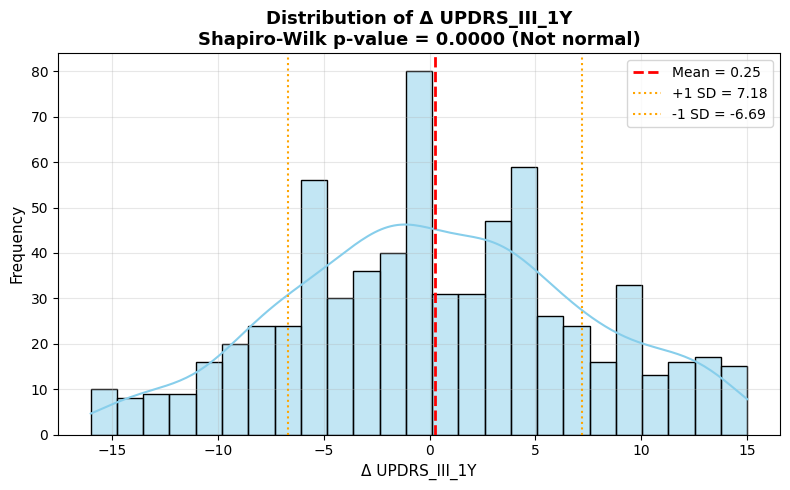

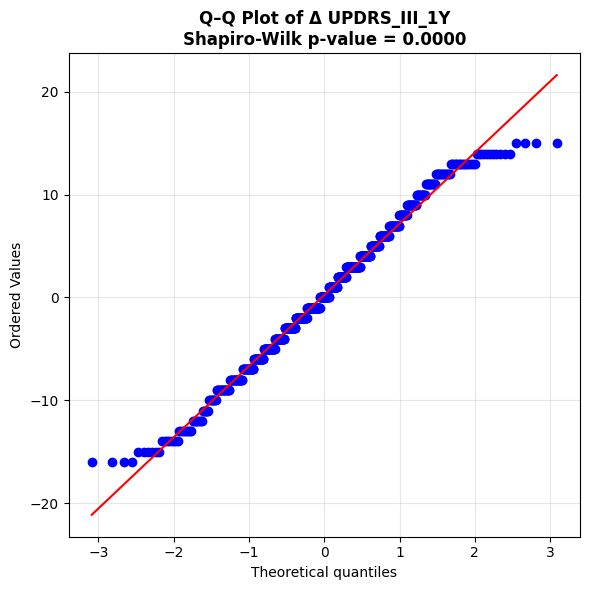

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, probplot

# Estadísticos básicos
mean_val = y_train_change_value.mean()
std_val  = y_train_change_value.std()

# Test de Shapiro-Wilk
shapiro_stat, shapiro_p = shapiro(y_train_change_value)
normality = "Normal" if shapiro_p > 0.05 else "Not normal"

# =========================
# HISTOGRAMA
# =========================
plt.figure(figsize=(8,5))

sns.histplot(
    data=y_train_change_value,
    bins=25,
    kde=True,
    color='skyblue',
    edgecolor='black'
)

# Líneas de media y ±1 SD
plt.axvline(mean_val, color='red', linestyle='--', linewidth=2,
            label=f'Mean = {mean_val:.2f}')
plt.axvline(mean_val + std_val, color='orange', linestyle=':', linewidth=1.5,
            label=f'+1 SD = {mean_val + std_val:.2f}')
plt.axvline(mean_val - std_val, color='orange', linestyle=':', linewidth=1.5,
            label=f'-1 SD = {mean_val - std_val:.2f}')

plt.title(
    f'Distribution of Δ UPDRS_III_1Y\n'
    f'Shapiro-Wilk p-value = {shapiro_p:.4f} ({normality})',
    fontsize=13,
    fontweight='bold'
)
plt.xlabel('Δ UPDRS_III_1Y', fontsize=11)
plt.ylabel('Frequency', fontsize=11)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# =========================
# Q–Q PLOT
# =========================
plt.figure(figsize=(6,6))
probplot(y_train_change_value, dist="norm", plot=plt)

plt.title(
    f'Q–Q Plot of Δ UPDRS_III_1Y\n'
    f'Shapiro-Wilk p-value = {shapiro_p:.4f}',
    fontsize=12,
    fontweight='bold'
)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()







# Model Default Analysis Regression

In [32]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.base import clone



from sklearn.model_selection import KFold, cross_validate
from sklearn.metrics import (
    make_scorer,
    mean_absolute_error,
    mean_squared_error,
    median_absolute_error,
    r2_score
)



mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
rmse_scorer = make_scorer(
    lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)),
    greater_is_better=False
)
medae_scorer = make_scorer(median_absolute_error, greater_is_better=False)
r2_scorer = make_scorer(r2_score)

def mae_int(y_true, y_pred):
    y_pred = np.rint(y_pred)  # redondeo al entero más cercano
    return mean_absolute_error(y_true, y_pred)

def rmse_int(y_true, y_pred):
    y_pred = np.rint(y_pred)
    return np.sqrt(mean_squared_error(y_true, y_pred))

def medae_int(y_true, y_pred):
    y_pred = np.rint(y_pred)
    return median_absolute_error(y_true, y_pred)

def r2_int(y_true, y_pred):
    y_pred = np.rint(y_pred)
    return r2_score(y_true, y_pred)


scoring_reg = {
    "mae": mae_scorer,
    'mae_int': make_scorer(mae_int, greater_is_better=False),
    "rmse": rmse_scorer,
    'rmse_int': make_scorer(rmse_int, greater_is_better=False),
    "medae": medae_scorer,
    'medae_int': make_scorer(medae_int, greater_is_better=False),
    "r2": r2_scorer,
    'r2_int': make_scorer(r2_int)
}


# CV
kf = KFold(n_splits=5, shuffle=True, random_state=42)

def cv_results_to_row_reg(results, model_name, parameters):
    row = {"Model": model_name, "Parameters": parameters}

    for k, v in results.items():
        if k.startswith("train_") or k.startswith("test_"):
            prefix, metric = k.split("_", 1)
            mean = np.mean(v)
            std = np.std(v)
            row[f"{prefix}_{metric}_std"] = f"{std:.4f}"
            row[f"{prefix}_{metric}"] = f"{mean:.4f}"

    return pd.DataFrame([row])


def model_default_evaluation_reg(dict_class, model):

    df_results_all = pd.DataFrame()
    len_dict = len(dict_class)
    for key in dict_class:
        print(f"Evaluating {type(model).__name__} - {key} ({list(dict_class).index(key)+1}/{len_dict})")
        X_tr = dict_class[key][0]
        y_tr = y_train_change_value
        selector =dict_class[key][1]
        scaler = dict_class[key][2]

        if 'FAMD' in key:
            pipe = Pipeline(steps=[
                ("famd", selector),
                ('clf', clone(model))
            ])
            
        else:

            if 'Multimodal' in key:
                numerical_col_use = numerical_col
                ordinal_cols_use = ordinal_cols
                nominal_cols_use = nominal_cols
            elif 'Motor' in key:
                numerical_col_use = numerical_col_motor_model
                ordinal_cols_use = ordinal_cols_motor_model
                nominal_cols_use = categorical_col_motor_model
            elif 'Cognitive' in key:
                numerical_col_use = numerical_col_cog_model
                ordinal_cols_use = ordinal_cols_cog_model
                nominal_cols_use = categorical_col_cog_model
            elif 'Sleep' in key:
                numerical_col_use = numerical_col_sleep_model
                ordinal_cols_use = ordinal_cols_sleep_model
                nominal_cols_use = categorical_col_sleep_model
                
            num_pipe = Pipeline([
                ("select", selector),
                ("scale", scaler)
            ])

            cat_pipe = Pipeline([
                ("onehot", OneHotEncoder(handle_unknown="ignore"))
            ])

            preprocess = ColumnTransformer([
                ("num", num_pipe, numerical_col_use + ordinal_cols_use),
                ("cat", cat_pipe, nominal_cols_use)
    ])


            pipe = Pipeline(steps=[
                ("prep", preprocess),
                ('clf', clone(model)),
            ])

        results = cross_validate(
            pipe,
            X_tr,
            y_tr,
            cv=kf,               
            scoring=scoring_reg,      
            return_train_score=True
        )

        df_results = cv_results_to_row_reg(   
            results,
            model_name=type(model).__name__,
            parameters=key
        )

        df_results_all = pd.concat([df_results_all, df_results], ignore_index=True)

    return df_results_all

## 1. Dummy Regressor

In [33]:
from sklearn.dummy import DummyRegressor

dummy_regr = DummyRegressor(strategy="mean")
basic_test={'Multimodal Data / No FS / No Scaler': [X_train,'passthrough','passthrough']}
dummy_regr_result = model_default_evaluation_reg(basic_test, dummy_regr)
dummy_regr_result


Evaluating DummyRegressor - Multimodal Data / No FS / No Scaler (1/1)


,Model,Parameters,test_mae_std,test_mae,train_mae_std,train_mae,test_mae_int_std,test_mae_int,train_mae_int_std,train_mae_int,...,train_medae_int_std,train_medae_int,test_r2_std,test_r2,train_r2_std,train_r2,test_r2_int_std,test_r2_int,train_r2_int_std,train_r2_int
0,DummyRegressor,Multimodal Data / No FS / No Scaler,0.4417,-5.6533,0.1117,-5.6455,0.4493,-5.6348,0.1123,-5.6348,...,0.0000,-5.0000,0.0043,-0.0048,0.0000,0.0000,0.0046,-0.0042,0.0011,-0.0015


## Data Combination

In [34]:
class_training = {
    'Multimodal Data / No FS / No Scaler': [X_train,'passthrough','passthrough'],
    'Multimodal Data / No FS / StandardScaler': [X_train,'passthrough', StandardScaler()],
    'Multimodal Data / No FS / MinMaxScaler': [X_train,'passthrough', MinMaxScaler()],
    'Multimodal Data / FS / MinMaxScaler': [X_train,SelectKBest(score_func=f_classif, k=10),MinMaxScaler()],
    'Multimodal Data / FS / StandardScaler': [X_train,SelectKBest(score_func=f_classif, k=10),StandardScaler()],
    'Multimodal FAMD Data': [X_train,prince.FAMD(n_components=15,n_iter=3,copy=True,check_input=True,random_state=42,engine="sklearn",handle_unknown="error" ),'passthrough'],

    'Motor Data / No FS / No Scaler': [X_train_motor_model,'passthrough','passthrough'],
    'Motor Data / No FS / StandardScaler': [X_train_motor_model,'passthrough', StandardScaler()],
    'Motor Data / No FS / MinMaxScaler': [X_train_motor_model,'passthrough', MinMaxScaler()],
    'Motor Data / FS / MinMaxScaler': [X_train_motor_model,SelectKBest(score_func=f_classif, k=10),MinMaxScaler()],
    'Motor Data / FS / StandardScaler': [X_train_motor_model,SelectKBest(score_func=f_classif, k=10),StandardScaler()],
    'Motor FAMD Data': [X_train_motor_model,prince.FAMD(n_components=12,n_iter=3,copy=True,check_input=True,random_state=42,engine="sklearn",handle_unknown="error" ),'passthrough'],

    'Cognitive Data / No FS / No Scaler': [X_train_cog_model,'passthrough','passthrough'],
    'Cognitive Data / No FS / StandardScaler': [X_train_cog_model,'passthrough', StandardScaler()],
    'Cognitive Data / No FS / MinMaxScaler': [X_train_cog_model,'passthrough', MinMaxScaler()],
    'Cognitive Data / FS / MinMaxScaler': [X_train_cog_model,SelectKBest(score_func=f_classif, k=10),MinMaxScaler()],
    'Cognitive Data / FS / StandardScaler': [X_train_cog_model,SelectKBest(score_func=f_classif, k=10),StandardScaler()],
    'Cognitive FAMD Data': [X_train_cog_model,prince.FAMD(n_components=14,n_iter=3,copy=True,check_input=True,random_state=42,engine="sklearn",handle_unknown="error" ),'passthrough'],

    'Sleep Data / No FS / No Scaler': [X_train_sleep_model,'passthrough','passthrough'],
    'Sleep Data / No FS / StandardScaler': [X_train_sleep_model,'passthrough', StandardScaler()],
    'Sleep Data / No FS / MinMaxScaler': [X_train_sleep_model,'passthrough', MinMaxScaler()],
    'Sleep Data / FS / MinMaxScaler': [X_train_sleep_model,SelectKBest(score_func=f_classif, k=6),MinMaxScaler()],
    'Sleep Data / FS / StandardScaler': [X_train_sleep_model,SelectKBest(score_func=f_classif, k=6),StandardScaler()],
    'Sleep FAMD Data': [X_train_sleep_model,prince.FAMD(n_components=9,n_iter=3,copy=True,check_input=True,random_state=42,engine="sklearn",handle_unknown="error" ),'passthrough']  
}

# 2. Regresión Lineal (OLS)

## 2.1 Ridge Regression

In [35]:
from sklearn.linear_model import Ridge
RidgeReg_model = Ridge(alpha=1.0)
RidgeReg_result = model_default_evaluation_reg(class_training, RidgeReg_model)
RidgeReg_result

Evaluating Ridge - Multimodal Data / No FS / No Scaler (1/24)
Evaluating Ridge - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating Ridge - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating Ridge - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating Ridge - Multimodal Data / FS / StandardScaler (5/24)
Evaluating Ridge - Multimodal FAMD Data (6/24)
Evaluating Ridge - Motor Data / No FS / No Scaler (7/24)
Evaluating Ridge - Motor Data / No FS / StandardScaler (8/24)
Evaluating Ridge - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating Ridge - Motor Data / FS / MinMaxScaler (10/24)
Evaluating Ridge - Motor Data / FS / StandardScaler (11/24)
Evaluating Ridge - Motor FAMD Data (12/24)
Evaluating Ridge - Cognitive Data / No FS / No Scaler (13/24)
Evaluating Ridge - Cognitive Data / No FS / StandardScaler (14/24)
Evaluating Ridge - Cognitive Data / No FS / MinMaxScaler (15/24)
Evaluating Ridge - Cognitive Data / FS / MinMaxScaler (16/24)
Evaluating Ridge - Cognitive Data / F

,Model,Parameters,test_mae_std,test_mae,train_mae_std,train_mae,test_mae_int_std,test_mae_int,train_mae_int_std,train_mae_int,...,train_medae_int_std,train_medae_int,test_r2_std,test_r2,train_r2_std,train_r2,test_r2_int_std,test_r2_int,train_r2_int_std,train_r2_int
0,Ridge,Multimodal Data / No FS / No Scaler,0.3447,-5.5812,0.1013,-5.0936,0.3540,-5.5841,0.1073,-5.0848,...,0.4899,-4.4000,0.0690,-0.0012,0.0154,0.1667,0.0725,-0.0072,0.0183,0.1658
1,Ridge,Multimodal Data / No FS / StandardScaler,0.3469,-5.5820,0.1014,-5.0932,0.3663,-5.5812,0.1040,-5.0870,...,0.4899,-4.4000,0.0699,-0.0018,0.0154,0.1667,0.0724,-0.0077,0.0177,0.1652
2,Ridge,Multimodal Data / No FS / MinMaxScaler,0.3367,-5.5647,0.0974,-5.1136,0.3592,-5.5493,0.0958,-5.1011,...,0.4472,-4.5000,0.0474,0.0074,0.0146,0.1624,0.0467,0.0042,0.0159,0.1625
3,Ridge,Multimodal Data / FS / MinMaxScaler,0.3192,-5.4593,0.0835,-5.2074,0.3173,-5.4594,0.0843,-5.2065,...,0.4000,-4.3000,0.0398,0.0416,0.0126,0.1333,0.0376,0.0391,0.0119,0.1298
4,Ridge,Multimodal Data / FS / StandardScaler,0.3141,-5.4629,0.0878,-5.1915,0.3069,-5.4522,0.0775,-5.1804,...,0.4000,-4.2000,0.0601,0.0388,0.0131,0.1362,0.0624,0.0369,0.0135,0.1360
5,Ridge,Multimodal FAMD Data,0.3798,-5.7352,0.1040,-5.6030,0.3654,-5.7145,0.1096,-5.5888,...,0.0000,-5.0000,0.0214,-0.0365,0.0035,0.0154,0.0263,-0.0362,0.0064,0.0171
6,Ridge,Motor Data / No FS / No Scaler,0.4157,-5.4371,0.0971,-5.1812,0.4152,-5.4275,0.0918,-5.1790,...,0.4000,-4.2000,0.0684,0.0476,0.0160,0.1416,0.0638,0.0496,0.0156,0.1382
7,Ridge,Motor Data / No FS / StandardScaler,0.4169,-5.4395,0.0972,-5.1810,0.4230,-5.4362,0.0944,-5.1804,...,0.4000,-4.3000,0.0696,0.0467,0.0160,0.1416,0.0680,0.0468,0.0150,0.1383
8,Ridge,Motor Data / No FS / MinMaxScaler,0.3960,-5.4442,0.0969,-5.1964,0.3830,-5.4290,0.0976,-5.1899,...,0.4899,-4.4000,0.0465,0.0507,0.0151,0.1383,0.0418,0.0545,0.0149,0.1372
9,Ridge,Motor Data / FS / MinMaxScaler,0.3949,-5.4452,0.0937,-5.2005,0.3832,-5.4319,0.0966,-5.2083,...,0.4899,-4.4000,0.0450,0.0511,0.0158,0.1369,0.0458,0.0507,0.0145,0.1322


## 2.2 Lasso Regression

In [42]:
from sklearn import linear_model
lasso_reg = linear_model.Lasso(alpha=0.1)
LassoReg_result = model_default_evaluation_reg(class_training, lasso_reg)
LassoReg_result

Evaluating Lasso - Multimodal Data / No FS / No Scaler (1/24)
Evaluating Lasso - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating Lasso - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating Lasso - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating Lasso - Multimodal Data / FS / StandardScaler (5/24)
Evaluating Lasso - Multimodal FAMD Data (6/24)
Evaluating Lasso - Motor Data / No FS / No Scaler (7/24)
Evaluating Lasso - Motor Data / No FS / StandardScaler (8/24)
Evaluating Lasso - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating Lasso - Motor Data / FS / MinMaxScaler (10/24)
Evaluating Lasso - Motor Data / FS / StandardScaler (11/24)
Evaluating Lasso - Motor FAMD Data (12/24)
Evaluating Lasso - Cognitive Data / No FS / No Scaler (13/24)
Evaluating Lasso - Cognitive Data / No FS / StandardScaler (14/24)
Evaluating Lasso - Cognitive Data / No FS / MinMaxScaler (15/24)
Evaluating Lasso - Cognitive Data / FS / MinMaxScaler (16/24)
Evaluating Lasso - Cognitive Data / F

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,Lasso,Multimodal Data / No FS / No Scaler,-5.4783,-5.1851,-5.4754,-5.1790,-6.7405,-6.4129,-6.7483,-6.4173,-4.7352,-4.5549,-4.7000,-4.8000,0.0425,0.1430,0.0400,0.1418
1,Lasso,Multimodal Data / No FS / StandardScaler,-5.4602,-5.1922,-5.4522,-5.1761,-6.7253,-6.4202,-6.7333,-6.4134,-4.7335,-4.5777,-4.6000,-4.6000,0.0478,0.1411,0.0454,0.1428
2,Lasso,Multimodal Data / No FS / MinMaxScaler,-5.4696,-5.3739,-5.4594,-5.3681,-6.7079,-6.6125,-6.7107,-6.6145,-4.6564,-4.5544,-4.4000,-4.7000,0.0548,0.0889,0.0536,0.0884
3,Lasso,Multimodal Data / FS / MinMaxScaler,-5.4896,-5.4153,-5.4855,-5.4145,-6.7162,-6.6544,-6.7182,-6.6634,-4.6974,-4.5644,-4.6000,-4.8000,0.0524,0.0772,0.0515,0.0747
4,Lasso,Multimodal Data / FS / StandardScaler,-5.3983,-5.2733,-5.3899,-5.2551,-6.6608,-6.5136,-6.6629,-6.5081,-4.6629,-4.5371,-4.6000,-4.4000,0.0662,0.1159,0.0656,0.1174
5,Lasso,Multimodal FAMD Data,-5.7225,-5.6041,-5.7159,-5.5967,-7.0080,-6.8756,-7.0209,-6.8782,-4.8415,-4.7254,-4.8000,-5.0000,-0.0317,0.0151,-0.0358,0.0144
6,Lasso,Motor Data / No FS / No Scaler,-5.4182,-5.2538,-5.4058,-5.2496,-6.6697,-6.4865,-6.6625,-6.4949,-4.6274,-4.4590,-4.7000,-4.4000,0.0640,0.1233,0.0661,0.1210
7,Lasso,Motor Data / No FS / StandardScaler,-5.4120,-5.2417,-5.4159,-5.2406,-6.6752,-6.4773,-6.6839,-6.4939,-4.7112,-4.5075,-4.6000,-4.5000,0.0627,0.1258,0.0604,0.1213
8,Lasso,Motor Data / No FS / MinMaxScaler,-5.4768,-5.3890,-5.4884,-5.3848,-6.7099,-6.6287,-6.7323,-6.6366,-4.7273,-4.5778,-4.6000,-4.7000,0.0543,0.0845,0.0477,0.0822
9,Lasso,Motor Data / FS / MinMaxScaler,-5.4768,-5.3890,-5.4884,-5.3848,-6.7099,-6.6287,-6.7323,-6.6366,-4.7273,-4.5778,-4.6000,-4.7000,0.0543,0.0845,0.0477,0.0822


## 2.3 Elastic Net

In [43]:
from sklearn.linear_model import ElasticNet
ElasticNet_regr = ElasticNet(random_state=0)
ElasticNet_result = model_default_evaluation_reg(class_training, ElasticNet_regr)
ElasticNet_result

Evaluating ElasticNet - Multimodal Data / No FS / No Scaler (1/24)
Evaluating ElasticNet - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating ElasticNet - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating ElasticNet - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating ElasticNet - Multimodal Data / FS / StandardScaler (5/24)
Evaluating ElasticNet - Multimodal FAMD Data (6/24)
Evaluating ElasticNet - Motor Data / No FS / No Scaler (7/24)
Evaluating ElasticNet - Motor Data / No FS / StandardScaler (8/24)
Evaluating ElasticNet - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating ElasticNet - Motor Data / FS / MinMaxScaler (10/24)
Evaluating ElasticNet - Motor Data / FS / StandardScaler (11/24)
Evaluating ElasticNet - Motor FAMD Data (12/24)
Evaluating ElasticNet - Cognitive Data / No FS / No Scaler (13/24)
Evaluating ElasticNet - Cognitive Data / No FS / StandardScaler (14/24)
Evaluating ElasticNet - Cognitive Data / No FS / MinMaxScaler (15/24)
Evaluating ElasticNet - 

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,ElasticNet,Multimodal Data / No FS / No Scaler,-5.4157,-5.2451,-5.4029,-5.2377,-6.6795,-6.4902,-6.6799,-6.4948,-4.6368,-4.5651,-4.6000,-4.8000,0.0601,0.1223,0.0603,0.1209
1,ElasticNet,Multimodal Data / No FS / StandardScaler,-5.5164,-5.4738,-5.5145,-5.4736,-6.7458,-6.7122,-6.7596,-6.7267,-4.7172,-4.5685,-4.4000,-4.6000,0.0444,0.0613,0.0406,0.0572
2,ElasticNet,Multimodal Data / No FS / MinMaxScaler,-5.6533,-5.6455,-5.6348,-5.6348,-6.9193,-6.9283,-6.9172,-6.9335,-4.8217,-4.8754,-4.7000,-5.0000,-0.0048,0.0000,-0.0042,-0.0015
3,ElasticNet,Multimodal Data / FS / MinMaxScaler,-5.6533,-5.6455,-5.6348,-5.6348,-6.9193,-6.9283,-6.9172,-6.9335,-4.8217,-4.8754,-4.7000,-5.0000,-0.0048,0.0000,-0.0042,-0.0015
4,ElasticNet,Multimodal Data / FS / StandardScaler,-5.5159,-5.4919,-5.5261,-5.4917,-6.7441,-6.7326,-6.7744,-6.7448,-4.7137,-4.6060,-4.6000,-4.6000,0.0448,0.0555,0.0358,0.0521
5,ElasticNet,Multimodal FAMD Data,-5.6886,-5.6175,-5.6928,-5.6134,-6.9616,-6.8917,-6.9819,-6.9023,-4.8539,-4.7396,-4.8000,-5.0000,-0.0175,0.0105,-0.0237,0.0075
6,ElasticNet,Motor Data / No FS / No Scaler,-5.3847,-5.2960,-5.3754,-5.2884,-6.6343,-6.5433,-6.6474,-6.5531,-4.6202,-4.4760,-4.6000,-4.3000,0.0740,0.1079,0.0703,0.1052
7,ElasticNet,Motor Data / No FS / StandardScaler,-5.5176,-5.4853,-5.5116,-5.4768,-6.7477,-6.7254,-6.7565,-6.7325,-4.7346,-4.5873,-4.6000,-4.6000,0.0438,0.0576,0.0412,0.0556
8,ElasticNet,Motor Data / No FS / MinMaxScaler,-5.6533,-5.6455,-5.6348,-5.6348,-6.9193,-6.9283,-6.9172,-6.9335,-4.8217,-4.8754,-4.7000,-5.0000,-0.0048,0.0000,-0.0042,-0.0015
9,ElasticNet,Motor Data / FS / MinMaxScaler,-5.6533,-5.6455,-5.6348,-5.6348,-6.9193,-6.9283,-6.9172,-6.9335,-4.8217,-4.8754,-4.7000,-5.0000,-0.0048,0.0000,-0.0042,-0.0015


## 2.4 Bayesian Ridge Regression

In [44]:
from sklearn import linear_model
bayesian_ridge_reg = linear_model.BayesianRidge()
BayesianRidge_result = model_default_evaluation_reg(class_training, bayesian_ridge_reg)
BayesianRidge_result

Evaluating BayesianRidge - Multimodal Data / No FS / No Scaler (1/24)
Evaluating BayesianRidge - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating BayesianRidge - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating BayesianRidge - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating BayesianRidge - Multimodal Data / FS / StandardScaler (5/24)
Evaluating BayesianRidge - Multimodal FAMD Data (6/24)
Evaluating BayesianRidge - Motor Data / No FS / No Scaler (7/24)
Evaluating BayesianRidge - Motor Data / No FS / StandardScaler (8/24)
Evaluating BayesianRidge - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating BayesianRidge - Motor Data / FS / MinMaxScaler (10/24)
Evaluating BayesianRidge - Motor Data / FS / StandardScaler (11/24)
Evaluating BayesianRidge - Motor FAMD Data (12/24)
Evaluating BayesianRidge - Cognitive Data / No FS / No Scaler (13/24)
Evaluating BayesianRidge - Cognitive Data / No FS / StandardScaler (14/24)
Evaluating BayesianRidge - Cognitive Data / No FS / 

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,BayesianRidge,Multimodal Data / No FS / No Scaler,-5.4265,-5.2677,-5.4174,-5.2489,-6.6783,-6.5093,-6.6877,-6.5122,-4.7111,-4.5205,-4.7000,-4.6000,0.0610,0.1171,0.0585,0.1162
1,BayesianRidge,Multimodal Data / No FS / StandardScaler,-5.5318,-5.2825,-5.5275,-5.2841,-6.7961,-6.5190,-6.8077,-6.5311,-4.8540,-4.4783,-4.9000,-4.4000,0.0291,0.1144,0.0260,0.1111
2,BayesianRidge,Multimodal Data / No FS / MinMaxScaler,-5.6461,-5.5319,-5.6362,-5.5279,-6.9245,-6.7897,-6.9279,-6.7991,-4.7315,-4.5965,-4.5000,-4.8000,-0.0069,0.0391,-0.0083,0.0365
3,BayesianRidge,Multimodal Data / FS / MinMaxScaler,-5.6499,-5.5430,-5.6217,-5.5322,-6.9214,-6.8021,-6.9027,-6.8047,-4.8079,-4.6541,-4.5000,-5.0000,-0.0056,0.0353,-0.0003,0.0346
4,BayesianRidge,Multimodal Data / FS / StandardScaler,-5.4424,-5.2733,-5.4507,-5.2790,-6.7098,-6.5174,-6.7305,-6.5314,-4.6481,-4.5353,-4.6000,-4.6000,0.0530,0.1148,0.0473,0.1110
5,BayesianRidge,Multimodal FAMD Data,-5.6538,-5.6450,-5.6348,-5.6348,-6.9197,-6.9274,-6.9172,-6.9335,-4.8218,-4.8736,-4.7000,-5.0000,-0.0050,0.0002,-0.0042,-0.0015
6,BayesianRidge,Motor Data / No FS / No Scaler,-5.3980,-5.2954,-5.3797,-5.2830,-6.6461,-6.5373,-6.6265,-6.5400,-4.7445,-4.4791,-4.6000,-4.6000,0.0708,0.1096,0.0762,0.1088
7,BayesianRidge,Motor Data / No FS / StandardScaler,-5.4425,-5.2485,-5.4348,-5.2373,-6.7107,-6.4838,-6.7054,-6.4854,-4.7882,-4.5103,-4.7000,-4.6000,0.0537,0.1240,0.0556,0.1236
8,BayesianRidge,Motor Data / No FS / MinMaxScaler,-5.5708,-5.3596,-5.5609,-5.3464,-6.8447,-6.5989,-6.8561,-6.5960,-4.8572,-4.6191,-4.8000,-4.6000,0.0170,0.0924,0.0137,0.0932
9,BayesianRidge,Motor Data / FS / MinMaxScaler,-5.5607,-5.3389,-5.5623,-5.3268,-6.8355,-6.5766,-6.8465,-6.5727,-4.8194,-4.6103,-4.6000,-4.8000,0.0196,0.0986,0.0163,0.0996


## 2.5 Huber Regressor

In [47]:
from sklearn.linear_model import HuberRegressor
huber = HuberRegressor(max_iter=10000)
Huber_result = model_default_evaluation_reg(class_training, huber)
Huber_result


Evaluating HuberRegressor - Multimodal Data / No FS / No Scaler (1/24)
Evaluating HuberRegressor - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating HuberRegressor - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating HuberRegressor - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating HuberRegressor - Multimodal Data / FS / StandardScaler (5/24)
Evaluating HuberRegressor - Multimodal FAMD Data (6/24)
Evaluating HuberRegressor - Motor Data / No FS / No Scaler (7/24)
Evaluating HuberRegressor - Motor Data / No FS / StandardScaler (8/24)
Evaluating HuberRegressor - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating HuberRegressor - Motor Data / FS / MinMaxScaler (10/24)
Evaluating HuberRegressor - Motor Data / FS / StandardScaler (11/24)
Evaluating HuberRegressor - Motor FAMD Data (12/24)
Evaluating HuberRegressor - Cognitive Data / No FS / No Scaler (13/24)
Evaluating HuberRegressor - Cognitive Data / No FS / StandardScaler (14/24)
Evaluating HuberRegressor - Cognitive 

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,HuberRegressor,Multimodal Data / No FS / No Scaler,-5.6232,-5.0238,-5.6290,-5.0163,-6.9935,-6.3800,-7.0120,-6.3945,-4.7192,-4.1096,-4.8000,-4.0000,-0.0316,0.1519,-0.0370,0.1480
1,HuberRegressor,Multimodal Data / No FS / StandardScaler,-5.6328,-5.0205,-5.6348,-5.0156,-7.0014,-6.3764,-7.0163,-6.3848,-4.6807,-4.0800,-4.8000,-4.0000,-0.0342,0.1528,-0.0382,0.1506
2,HuberRegressor,Multimodal Data / No FS / MinMaxScaler,-5.6329,-5.0205,-5.6333,-5.0145,-7.0013,-6.3763,-7.0157,-6.3826,-4.6812,-4.0797,-4.8000,-4.0000,-0.0342,0.1528,-0.0380,0.1512
3,HuberRegressor,Multimodal Data / FS / MinMaxScaler,-5.4818,-5.1450,-5.4768,-5.1464,-6.8301,-6.4726,-6.8185,-6.4842,-4.6138,-4.2685,-4.7000,-4.0000,0.0166,0.1271,0.0199,0.1239
4,HuberRegressor,Multimodal Data / FS / StandardScaler,-5.4819,-5.1450,-5.4768,-5.1457,-6.8302,-6.4726,-6.8185,-6.4834,-4.6133,-4.2687,-4.7000,-4.0000,0.0166,0.1271,0.0199,0.1241
5,HuberRegressor,Multimodal FAMD Data,-5.7629,-5.5852,-5.7580,-5.5837,-7.0544,-6.8866,-7.0580,-6.8980,-4.9381,-4.6838,-4.8000,-4.9000,-0.0458,0.0120,-0.0465,0.0087
6,HuberRegressor,Motor Data / No FS / No Scaler,-5.4448,-5.1428,-5.4319,-5.1428,-6.7651,-6.4539,-6.7657,-6.4627,-4.5668,-4.2582,-4.7000,-4.0000,0.0353,0.1322,0.0352,0.1298
7,HuberRegressor,Motor Data / No FS / StandardScaler,-5.4675,-5.1368,-5.4594,-5.1315,-6.7987,-6.4502,-6.8067,-6.4564,-4.6015,-4.2897,-4.5000,-4.0000,0.0257,0.1332,0.0231,0.1315
8,HuberRegressor,Motor Data / No FS / MinMaxScaler,-5.4676,-5.1368,-5.4580,-5.1315,-6.7986,-6.4502,-6.8048,-6.4573,-4.6015,-4.2901,-4.5000,-4.0000,0.0257,0.1332,0.0236,0.1313
9,HuberRegressor,Motor Data / FS / MinMaxScaler,-5.4628,-5.1446,-5.4507,-5.1355,-6.7913,-6.4536,-6.7960,-6.4575,-4.5416,-4.2739,-4.6000,-4.0000,0.0279,0.1322,0.0263,0.1312


## 2.6 Theil–Sen Regressor

In [48]:
from sklearn.linear_model import TheilSenRegressor
theil_model = TheilSenRegressor(random_state=42)
Theil_result = model_default_evaluation_reg(class_training, theil_model)
Theil_result

Evaluating TheilSenRegressor - Multimodal Data / No FS / No Scaler (1/24)
Evaluating TheilSenRegressor - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating TheilSenRegressor - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating TheilSenRegressor - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating TheilSenRegressor - Multimodal Data / FS / StandardScaler (5/24)
Evaluating TheilSenRegressor - Multimodal FAMD Data (6/24)
Evaluating TheilSenRegressor - Motor Data / No FS / No Scaler (7/24)
Evaluating TheilSenRegressor - Motor Data / No FS / StandardScaler (8/24)
Evaluating TheilSenRegressor - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating TheilSenRegressor - Motor Data / FS / MinMaxScaler (10/24)
Evaluating TheilSenRegressor - Motor Data / FS / StandardScaler (11/24)
Evaluating TheilSenRegressor - Motor FAMD Data (12/24)
Evaluating TheilSenRegressor - Cognitive Data / No FS / No Scaler (13/24)
Evaluating TheilSenRegressor - Cognitive Data / No FS / StandardScaler (14/

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,TheilSenRegressor,Multimodal Data / No FS / No Scaler,-5.5877,-5.1061,-5.5841,-5.0957,-6.9059,-6.3484,-6.9152,-6.3446,-4.8216,-4.4856,-4.6000,-4.6000,-0.0042,0.1602,-0.0066,0.1612
1,TheilSenRegressor,Multimodal Data / No FS / StandardScaler,-5.5893,-5.0973,-5.5696,-5.0793,-6.9094,-6.3440,-6.9077,-6.3373,-4.8194,-4.4650,-4.8000,-4.4000,-0.0059,0.1614,-0.0052,0.1632
2,TheilSenRegressor,Multimodal Data / No FS / MinMaxScaler,-5.5913,-5.0999,-5.5667,-5.0859,-6.9112,-6.3438,-6.9053,-6.3412,-4.8281,-4.4702,-4.8000,-4.4000,-0.0063,0.1614,-0.0043,0.1621
3,TheilSenRegressor,Multimodal Data / FS / MinMaxScaler,-5.4702,-5.2038,-5.4725,-5.2011,-6.7691,-6.4528,-6.7770,-6.4610,-4.8008,-4.4867,-4.8000,-4.5000,0.0345,0.1323,0.0326,0.1302
4,TheilSenRegressor,Multimodal Data / FS / StandardScaler,-5.4670,-5.2025,-5.4725,-5.1967,-6.7661,-6.4529,-6.7837,-6.4579,-4.8079,-4.4870,-4.8000,-4.4000,0.0353,0.1323,0.0307,0.1310
5,TheilSenRegressor,Multimodal FAMD Data,-8.1204,-8.1879,-8.1159,-8.1862,-13.2217,-14.4090,-13.2311,-14.4117,-5.8842,-5.6920,-6.0000,-5.8000,-2.8310,-3.5118,-2.8358,-3.5137
6,TheilSenRegressor,Motor Data / No FS / No Scaler,-5.4831,-5.2744,-5.5000,-5.2594,-6.8082,-6.5292,-6.8317,-6.5295,-4.7472,-4.5355,-4.9000,-4.7000,0.0237,0.1116,0.0172,0.1116
7,TheilSenRegressor,Motor Data / No FS / StandardScaler,-5.4467,-5.1981,-5.4435,-5.1902,-6.7391,-6.4368,-6.7461,-6.4431,-4.6861,-4.4602,-4.7000,-4.4000,0.0448,0.1367,0.0428,0.1350
8,TheilSenRegressor,Motor Data / No FS / MinMaxScaler,-5.4502,-5.1995,-5.4594,-5.1873,-6.7429,-6.4365,-6.7621,-6.4390,-4.6738,-4.4520,-4.7000,-4.4000,0.0438,0.1368,0.0385,0.1361
9,TheilSenRegressor,Motor Data / FS / MinMaxScaler,-5.4457,-5.1956,-5.4522,-5.1891,-6.7286,-6.4388,-6.7525,-6.4440,-4.5399,-4.4847,-4.6000,-4.4000,0.0479,0.1362,0.0404,0.1348


## 2.7 Decision Tree Regressor

In [49]:
from sklearn.tree import DecisionTreeRegressor
decision_tree_reg = DecisionTreeRegressor(
    criterion="squared_error",
    max_depth=3,
    min_samples_split=30,
    min_samples_leaf=15,
    random_state=42
)
DecisionTree_result = model_default_evaluation_reg(class_training, decision_tree_reg)
DecisionTree_result

Evaluating DecisionTreeRegressor - Multimodal Data / No FS / No Scaler (1/24)
Evaluating DecisionTreeRegressor - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating DecisionTreeRegressor - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating DecisionTreeRegressor - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating DecisionTreeRegressor - Multimodal Data / FS / StandardScaler (5/24)
Evaluating DecisionTreeRegressor - Multimodal FAMD Data (6/24)
Evaluating DecisionTreeRegressor - Motor Data / No FS / No Scaler (7/24)
Evaluating DecisionTreeRegressor - Motor Data / No FS / StandardScaler (8/24)
Evaluating DecisionTreeRegressor - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating DecisionTreeRegressor - Motor Data / FS / MinMaxScaler (10/24)
Evaluating DecisionTreeRegressor - Motor Data / FS / StandardScaler (11/24)
Evaluating DecisionTreeRegressor - Motor FAMD Data (12/24)
Evaluating DecisionTreeRegressor - Cognitive Data / No FS / No Scaler (13/24)
Evaluating DecisionTree

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,DecisionTreeRegressor,Multimodal Data / No FS / No Scaler,-5.5653,-5.1500,-5.5565,-5.1504,-6.8268,-6.3810,-6.8333,-6.3893,-4.8217,-4.5192,-4.8000,-4.4000,0.0199,0.1517,0.0182,0.1495
1,DecisionTreeRegressor,Multimodal Data / No FS / StandardScaler,-5.5653,-5.1500,-5.5565,-5.1504,-6.8268,-6.3810,-6.8333,-6.3893,-4.8217,-4.5192,-4.8000,-4.4000,0.0199,0.1517,0.0182,0.1495
2,DecisionTreeRegressor,Multimodal Data / No FS / MinMaxScaler,-5.5653,-5.1500,-5.5565,-5.1504,-6.8268,-6.3810,-6.8333,-6.3893,-4.8217,-4.5192,-4.8000,-4.4000,0.0199,0.1517,0.0182,0.1495
3,DecisionTreeRegressor,Multimodal Data / FS / MinMaxScaler,-5.6633,-5.2171,-5.6623,-5.2112,-6.9078,-6.4271,-6.9203,-6.4345,-4.9357,-4.5101,-4.8000,-4.4000,-0.0045,0.1393,-0.0087,0.1373
4,DecisionTreeRegressor,Multimodal Data / FS / StandardScaler,-5.6633,-5.2171,-5.6623,-5.2112,-6.9078,-6.4271,-6.9203,-6.4345,-4.9357,-4.5101,-4.8000,-4.4000,-0.0045,0.1393,-0.0087,0.1373
5,DecisionTreeRegressor,Multimodal FAMD Data,-5.8725,-5.4137,-5.8971,-5.4025,-7.2352,-6.6677,-7.2700,-6.6764,-5.1101,-4.6443,-5.3000,-4.8000,-0.1025,0.0735,-0.1137,0.0710
6,DecisionTreeRegressor,Motor Data / No FS / No Scaler,-5.5594,-5.1487,-5.5522,-5.1525,-6.8187,-6.3884,-6.8287,-6.3976,-4.8631,-4.3928,-4.7000,-4.2000,0.0233,0.1497,0.0203,0.1473
7,DecisionTreeRegressor,Motor Data / No FS / StandardScaler,-5.5594,-5.1487,-5.5522,-5.1525,-6.8187,-6.3884,-6.8287,-6.3976,-4.8631,-4.3928,-4.7000,-4.2000,0.0233,0.1497,0.0203,0.1473
8,DecisionTreeRegressor,Motor Data / No FS / MinMaxScaler,-5.5594,-5.1487,-5.5522,-5.1525,-6.8187,-6.3884,-6.8287,-6.3976,-4.8631,-4.3928,-4.7000,-4.2000,0.0233,0.1497,0.0203,0.1473
9,DecisionTreeRegressor,Motor Data / FS / MinMaxScaler,-5.5856,-5.1418,-5.5855,-5.1446,-6.8325,-6.3831,-6.8493,-6.3919,-4.8631,-4.3974,-4.7000,-4.2000,0.0196,0.1511,0.0149,0.1488


## 2.8 RANDOM FOREST REGRESSOR

In [50]:
from sklearn.ensemble import RandomForestRegressor
regr = RandomForestRegressor(max_depth=2, random_state=0)
RandomForest_result = model_default_evaluation_reg(class_training, regr)
RandomForest_result

Evaluating RandomForestRegressor - Multimodal Data / No FS / No Scaler (1/24)
Evaluating RandomForestRegressor - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating RandomForestRegressor - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating RandomForestRegressor - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating RandomForestRegressor - Multimodal Data / FS / StandardScaler (5/24)
Evaluating RandomForestRegressor - Multimodal FAMD Data (6/24)
Evaluating RandomForestRegressor - Motor Data / No FS / No Scaler (7/24)
Evaluating RandomForestRegressor - Motor Data / No FS / StandardScaler (8/24)
Evaluating RandomForestRegressor - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating RandomForestRegressor - Motor Data / FS / MinMaxScaler (10/24)
Evaluating RandomForestRegressor - Motor Data / FS / StandardScaler (11/24)
Evaluating RandomForestRegressor - Motor FAMD Data (12/24)
Evaluating RandomForestRegressor - Cognitive Data / No FS / No Scaler (13/24)
Evaluating RandomForest

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,RandomForestRegressor,Multimodal Data / No FS / No Scaler,-5.4681,-5.2236,-5.4623,-5.2250,-6.6676,-6.4071,-6.6753,-6.4162,-4.8521,-4.5276,-4.9000,-4.8000,0.0663,0.1447,0.0636,0.1423
1,RandomForestRegressor,Multimodal Data / No FS / StandardScaler,-5.4674,-5.2236,-5.4623,-5.2243,-6.6667,-6.4072,-6.6753,-6.4154,-4.8521,-4.5276,-4.9000,-4.8000,0.0666,0.1447,0.0636,0.1425
2,RandomForestRegressor,Multimodal Data / No FS / MinMaxScaler,-5.4682,-5.2236,-5.4623,-5.2250,-6.6677,-6.4070,-6.6753,-6.4162,-4.8521,-4.5237,-4.9000,-4.8000,0.0663,0.1448,0.0636,0.1423
3,RandomForestRegressor,Multimodal Data / FS / MinMaxScaler,-5.4890,-5.2921,-5.4826,-5.2844,-6.7050,-6.4936,-6.7088,-6.4957,-4.8241,-4.5652,-4.8000,-4.6000,0.0549,0.1214,0.0541,0.1208
4,RandomForestRegressor,Multimodal Data / FS / StandardScaler,-5.4885,-5.2922,-5.4826,-5.2844,-6.7043,-6.4936,-6.7088,-6.4957,-4.8241,-4.5652,-4.8000,-4.6000,0.0551,0.1214,0.0541,0.1208
5,RandomForestRegressor,Multimodal FAMD Data,-5.6919,-5.4661,-5.6841,-5.4562,-6.9758,-6.6863,-6.9774,-6.6846,-4.8577,-4.6280,-4.9000,-4.6000,-0.0214,0.0686,-0.0221,0.0690
6,RandomForestRegressor,Motor Data / No FS / No Scaler,-5.4682,-5.2376,-5.4594,-5.2304,-6.6733,-6.4287,-6.6700,-6.4306,-4.8989,-4.5356,-4.9000,-4.5000,0.0651,0.1389,0.0658,0.1385
7,RandomForestRegressor,Motor Data / No FS / StandardScaler,-5.4676,-5.2377,-5.4580,-5.2297,-6.6727,-6.4288,-6.6688,-6.4298,-4.8989,-4.5339,-4.9000,-4.5000,0.0653,0.1389,0.0661,0.1387
8,RandomForestRegressor,Motor Data / No FS / MinMaxScaler,-5.4681,-5.2375,-5.4623,-5.2312,-6.6731,-6.4285,-6.6732,-6.4310,-4.8989,-4.5356,-4.9000,-4.5000,0.0652,0.1390,0.0649,0.1384
9,RandomForestRegressor,Motor Data / FS / MinMaxScaler,-5.4736,-5.2437,-5.4710,-5.2399,-6.6806,-6.4360,-6.6836,-6.4433,-4.9148,-4.5407,-4.9000,-4.6000,0.0634,0.1369,0.0623,0.1350


## 2.9 Extra Trees Regressor

In [52]:
from sklearn.ensemble import ExtraTreesRegressor
reg = ExtraTreesRegressor(n_estimators=1000, random_state=42, max_depth=5)
ExtraTrees_result = model_default_evaluation_reg(class_training, reg)
ExtraTrees_result


Evaluating ExtraTreesRegressor - Multimodal Data / No FS / No Scaler (1/24)
Evaluating ExtraTreesRegressor - Multimodal Data / No FS / StandardScaler (2/24)
Evaluating ExtraTreesRegressor - Multimodal Data / No FS / MinMaxScaler (3/24)
Evaluating ExtraTreesRegressor - Multimodal Data / FS / MinMaxScaler (4/24)
Evaluating ExtraTreesRegressor - Multimodal Data / FS / StandardScaler (5/24)
Evaluating ExtraTreesRegressor - Multimodal FAMD Data (6/24)
Evaluating ExtraTreesRegressor - Motor Data / No FS / No Scaler (7/24)
Evaluating ExtraTreesRegressor - Motor Data / No FS / StandardScaler (8/24)
Evaluating ExtraTreesRegressor - Motor Data / No FS / MinMaxScaler (9/24)
Evaluating ExtraTreesRegressor - Motor Data / FS / MinMaxScaler (10/24)
Evaluating ExtraTreesRegressor - Motor Data / FS / StandardScaler (11/24)
Evaluating ExtraTreesRegressor - Motor FAMD Data (12/24)
Evaluating ExtraTreesRegressor - Cognitive Data / No FS / No Scaler (13/24)
Evaluating ExtraTreesRegressor - Cognitive Data /

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,ExtraTreesRegressor,Multimodal Data / No FS / No Scaler,-5.4666,-4.5378,-5.4522,-4.5344,-6.6742,-5.5846,-6.6793,-5.5951,-4.7319,-3.8950,-4.6000,-4.0000,0.0660,0.3501,0.0644,0.3477
1,ExtraTreesRegressor,Multimodal Data / No FS / StandardScaler,-5.4666,-4.5378,-5.4522,-4.5344,-6.6742,-5.5846,-6.6793,-5.5951,-4.7319,-3.8950,-4.6000,-4.0000,0.0660,0.3501,0.0644,0.3477
2,ExtraTreesRegressor,Multimodal Data / No FS / MinMaxScaler,-5.4666,-4.5378,-5.4522,-4.5344,-6.6742,-5.5846,-6.6793,-5.5951,-4.7319,-3.8950,-4.6000,-4.0000,0.0660,0.3501,0.0644,0.3477
3,ExtraTreesRegressor,Multimodal Data / FS / MinMaxScaler,-5.5024,-4.7104,-5.5087,-4.7094,-6.7251,-5.8114,-6.7368,-5.8215,-4.7825,-3.9953,-4.8000,-4.0000,0.0509,0.2963,0.0475,0.2939
4,ExtraTreesRegressor,Multimodal Data / FS / StandardScaler,-5.5024,-4.7104,-5.5087,-4.7094,-6.7251,-5.8114,-6.7368,-5.8215,-4.7825,-3.9953,-4.8000,-4.0000,0.0509,0.2963,0.0475,0.2939
5,ExtraTreesRegressor,Multimodal FAMD Data,-5.7143,-5.2107,-5.7043,-5.1982,-6.9933,-6.3892,-6.9980,-6.3885,-4.9016,-4.3996,-4.8000,-4.2000,-0.0267,0.1495,-0.0287,0.1496
6,ExtraTreesRegressor,Motor Data / No FS / No Scaler,-5.4833,-4.7009,-5.4797,-4.6884,-6.7180,-5.8144,-6.7285,-5.8135,-4.9925,-4.0806,-5.1000,-4.0000,0.0531,0.2955,0.0497,0.2957
7,ExtraTreesRegressor,Motor Data / No FS / StandardScaler,-5.4833,-4.7009,-5.4797,-4.6884,-6.7180,-5.8144,-6.7285,-5.8135,-4.9925,-4.0806,-5.1000,-4.0000,0.0531,0.2955,0.0497,0.2957
8,ExtraTreesRegressor,Motor Data / No FS / MinMaxScaler,-5.4833,-4.7009,-5.4797,-4.6884,-6.7180,-5.8144,-6.7285,-5.8135,-4.9925,-4.0806,-5.1000,-4.0000,0.0531,0.2955,0.0497,0.2957
9,ExtraTreesRegressor,Motor Data / FS / MinMaxScaler,-5.4915,-4.7144,-5.4928,-4.6996,-6.7221,-5.8286,-6.7353,-5.8308,-4.9617,-4.0897,-5.0000,-4.0000,0.0520,0.2921,0.0477,0.2915


## 3. Boosting

In [29]:
from catboost import CatBoostRegressor
model = CatBoostRegressor(learning_rate=0.05, depth=8, loss_function='RMSE',iterations=2000,random_seed=42)
CatBoost_result = model_default_evaluation_reg(class_training, model)
CatBoost_result


Evaluating CatBoostRegressor - Multimodal Data / No FS / No Scaler (1/24)
0:	learn: 7.0690517	total: 52.1ms	remaining: 1m 44s
1:	learn: 7.0112829	total: 57.9ms	remaining: 57.9s
2:	learn: 6.9510277	total: 63.1ms	remaining: 42s
3:	learn: 6.9101156	total: 67.7ms	remaining: 33.8s
4:	learn: 6.8728285	total: 71.9ms	remaining: 28.7s
5:	learn: 6.8185204	total: 76.4ms	remaining: 25.4s
6:	learn: 6.7746335	total: 80.9ms	remaining: 23s
7:	learn: 6.7329828	total: 85.1ms	remaining: 21.2s
8:	learn: 6.6980275	total: 89.5ms	remaining: 19.8s
9:	learn: 6.6390786	total: 93.2ms	remaining: 18.5s
10:	learn: 6.5895883	total: 96.7ms	remaining: 17.5s
11:	learn: 6.5551017	total: 100ms	remaining: 16.6s
12:	learn: 6.5195533	total: 104ms	remaining: 15.8s
13:	learn: 6.4848097	total: 107ms	remaining: 15.2s
14:	learn: 6.4457884	total: 110ms	remaining: 14.6s
15:	learn: 6.4111573	total: 113ms	remaining: 14.1s
16:	learn: 6.3799006	total: 117ms	remaining: 13.6s
17:	learn: 6.3456211	total: 120ms	remaining: 13.2s
18:	learn:

,Model,Parameters,test_mae,train_mae,test_mae_int,train_mae_int,test_rmse,train_rmse,test_rmse_int,train_rmse_int,test_medae,train_medae,test_medae_int,train_medae_int,test_r2,train_r2,test_r2_int,train_r2_int
0,CatBoostRegressor,Multimodal Data / No FS / No Scaler,-5.6793,-0.0009,-5.6913,0.0000,-6.9186,-0.0013,-6.9182,0.0000,-4.9846,-0.0006,-5.0000,0.0000,-0.0025,1.0000,-0.0024,1.0000
1,CatBoostRegressor,Multimodal Data / No FS / StandardScaler,-5.6780,-0.0009,-5.6899,0.0000,-6.9169,-0.0013,-6.9166,0.0000,-4.9846,-0.0006,-5.0000,0.0000,-0.0020,1.0000,-0.0020,1.0000
2,CatBoostRegressor,Multimodal Data / No FS / MinMaxScaler,-5.6800,-0.0009,-5.6899,0.0000,-6.9190,-0.0013,-6.9166,0.0000,-4.9866,-0.0006,-5.0000,0.0000,-0.0026,1.0000,-0.0019,1.0000
3,CatBoostRegressor,Multimodal Data / FS / MinMaxScaler,-5.9001,-0.0347,-5.8971,0.0000,-7.1456,-0.0517,-7.1570,0.0000,-5.2892,-0.0217,-5.2000,0.0000,-0.0712,0.9999,-0.0747,1.0000
4,CatBoostRegressor,Multimodal Data / FS / StandardScaler,-5.8971,-0.0347,-5.8957,0.0000,-7.1424,-0.0517,-7.1546,0.0000,-5.2934,-0.0217,-5.3000,0.0000,-0.0702,0.9999,-0.0739,1.0000
5,CatBoostRegressor,Multimodal FAMD Data,-6.2780,-0.2221,-6.2681,-0.0793,-7.7709,-0.2817,-7.7797,-0.2627,-5.3745,-0.1739,-5.4000,0.0000,-0.2731,0.9983,-0.2760,0.9984
6,CatBoostRegressor,Motor Data / No FS / No Scaler,-5.9159,-0.0746,-5.9043,-0.0007,-7.2630,-0.1027,-7.2604,-0.0120,-5.1012,-0.0513,-5.2000,0.0000,-0.1094,0.9998,-0.1085,1.0000
7,CatBoostRegressor,Motor Data / No FS / StandardScaler,-5.9154,-0.0746,-5.9029,-0.0007,-7.2628,-0.1027,-7.2594,-0.0120,-5.1015,-0.0513,-5.2000,0.0000,-0.1094,0.9998,-0.1082,1.0000
8,CatBoostRegressor,Motor Data / No FS / MinMaxScaler,-5.9167,-0.0746,-5.9072,-0.0007,-7.2639,-0.1027,-7.2613,-0.0120,-5.1015,-0.0513,-5.2000,0.0000,-0.1097,0.9998,-0.1088,1.0000
9,CatBoostRegressor,Motor Data / FS / MinMaxScaler,-5.9220,-0.1294,-5.9014,-0.0199,-7.3110,-0.1792,-7.2992,-0.1369,-5.1255,-0.0853,-5.0000,0.0000,-0.1241,0.9993,-0.1208,0.9996


In [90]:
import sklearn, catboost
print("sklearn:", sklearn.__version__)
print("catboost:", catboost.__version__)

sklearn: 1.8.0
catboost: 1.2.8
